<a href="https://colab.research.google.com/github/claudio-bon/encoding-techniques/blob/main/encoding_techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Assignment 2

**Due to**: 9th November, 2020

**Credits**: Andrea Galassi, Federico Ruggeri, Paolo Torroni

**Summary**: Word embeddings, from sparse to dense representations

# Intro

In this assignment we will explore text encoding techniques, spanning from sparse representations, such as bag-of-words, to dense representations.

In particular, we will see:

*   Building a vocabulary
*   Building a word-word co-occurrence matrix
*   Defining a similarity metric: cosine similarity
*   Embedding visualization and analysis of their semantic properties
*   Better sparse representations via PPMI weighting
*   Loading pre-trained dense word embeddings (Word2Vec, GloVe)
*   Checking out-of-vocabulary (OOV) terms
*   Handling OOV terms



# Initial Setup

First of all, we need to import some useful packages that we will use during this hands-on session.

In [ ]:
# system packages
import os
import shutil
import sys

# data and numerical management packages
import pandas as pd
import numpy as np

# useful during debugging (progress bars)
from tqdm import tqdm

# [Part I] Sparse embeddings

As you know, working with text inherently requires a conversion step, formally known as embedding, that simply allows us to pass from string-like text to corresponding numerical representation. 

One of the most notable embedding method is the bag-of-words one (BoW). We simply count the occurrence of each word in the given corpus so as to build some useful data structures (matrices) that may give us some general idea of how the dataset is organized. For example, we can check where a particular word appears or, in a reversed perspective, identify the most common terms in each given document.

This type of reasoning is directly related to how meaning is assigned to words. In particular, it is the environment itself, enclosing a word, that gives a specific meaning to it. Thus, we look for numerical encoding methods that reflect such point of view.

Before diving into embedding analysis, we need to prepare a dataset and, most importantly, extract a vocabulary!

## Prepare a dataset for experiments

We will use the IMDB dataset of previous assignment. As you already know, it is a dataset of 50k sentences used for sentiment analysis. In particular, half of them (25k) is labelled as containing positive sentiment, whereas the remaining half are sentences of negative polarity.

Contrarily to first assignment, we will ignore sentiment labels and we will focus only on learning a proper word embedding representation.

### Download and extraction

We start by downloading the dataset and extract it to a folder.

In [ ]:
from urllib import request
import tarfile

# Config
print("Current work directory: {}".format(os.getcwd()))

dataset_folder = os.path.join(os.getcwd(), "Datasets")

if not os.path.exists(dataset_folder):
    os.makedirs(dataset_folder)

url = "http://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz"

dataset_path = os.path.join(dataset_folder, "Movies.tar.gz")

print(dataset_path)

def download_dataset(download_path, url):
    if not os.path.exists(download_path):
        print("Downloading dataset...")
        request.urlretrieve(url, download_path)
        print("Download complete!")

def extract_dataset(download_path, extract_path):
    print("Extracting dataset... (it may take a while...)")
    with tarfile.open(download_path) as loaded_tar:
        loaded_tar.extractall(extract_path)
    print("Extraction completed!")

# Download
download_dataset(dataset_path, url)

# Extraction
extract_dataset(dataset_path, dataset_folder)


Current work directory: /content
/content/Datasets/Movies.tar.gz
Extracting dataset... (it may take a while...)
Extraction completed!


Feel free to check the dataset folder content. Usually, the README file is a good starting point (if it exists and its well done, which is not so common!).

Just like in the first assignment, we need a high level view of the dataset that is helpful to our needs. Thus, we will encode the dataset into a [pandas DataFrame](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.html).

In [ ]:
# Config
dataset_name = "aclImdb"
debug = True

def encode_dataset(dataset_name, debug=True):
    dataframe_rows = []

    for split in tqdm(['train', 'test']):
        for sentiment in ['pos', 'neg']:
            folder = os.path.join(os.getcwd(), "Datasets", dataset_name, split, sentiment)
            for filename in os.listdir(folder):
                file_path = os.path.join(folder, filename)
                try:
                    if os.path.isfile(file_path):
                        # open the file
                        with open(file_path, mode='r', encoding='utf-8') as text_file:
                            # read it and extract informations
                            text = text_file.read()
                            score = filename.split("_")[1].split(".")[0]
                            file_id = filename.split("_")[0]

                            num_sentiment = -1

                            if sentiment == "pos" : num_sentiment = 1
                            elif sentiment == "neg" : num_sentiment = 0

                            # create single dataframe row
                            dataframe_row = {
                                "file_id": file_id,
                                "score": score,
                                "sentiment": num_sentiment,
                                "split": split,
                                "text": text
                            }

                            # print detailed info for the first file
                            if debug:
                                print(file_path)
                                print(filename)
                                print(file_id)
                                print(text)
                                print(score)
                                print(sentiment)
                                print(split)
                                print(dataframe_row)
                                debug = False
                            dataframe_rows.append(dataframe_row)

                except Exception as e:
                    print('Failed to process %s. Reason: %s' % (file_path, e))
                    sys.exit(0)

    folder = os.path.join(os.getcwd(), "Datasets", "Dataframes", dataset_name)
    if not os.path.exists(folder):
        os.makedirs(folder)

    # transform the list of rows in a proper dataframe
    df = pd.DataFrame(dataframe_rows)
    df = df[["file_id",
                        "score",
                        "sentiment",
                        "split",
                        "text"]]
    dataframe_path = os.path.join(folder, dataset_name + ".pkl")
    df.to_pickle(dataframe_path)

    return df


# Encoding
print("Encoding dataset...")
df = encode_dataset(dataset_name, debug)
print("Encoding completed!")

  0%|          | 0/2 [00:00<?, ?it/s]

Encoding dataset...
/content/Datasets/aclImdb/train/pos/3463_7.txt
3463_7.txt
3463
I am a big Beatles fan. My favorite Beatle is Paul and my least favorite is John. I already knew quite a bit about the Beatles music and the truth behind the breakup, as well as things like John Lennon's family and Paul's band Wings. I was curious to see how this movie would handle the relationship between John and Paul so many years after the breakup.<br /><br />I was not disappointed by this movie. Although the story itself is fiction, many of the references that the two musicians used were very accurate. These included how Yoko Ono would always be with John wherever he went, the Wings song "Silly Love Songs" being the number one hit that year and the concert on the roof of Apple Studios playing music from the album "Let It Be."<br /><br />The actors did a very good job in playing John and Paul. The accents could had used maybe a bit more work, but they seemed to act a lot like I've read the two former

100%|██████████| 2/2 [00:01<00:00,  1.22it/s]


Encoding completed!


### Loading and Visualization

The next step is to load the dataset and inspect some of its elements in order to have an idea of the general content. We will use **pandas** library for dataset loading as follows.

In [ ]:
# Inspection
print("Dataset size: {}".format(df.shape)) # (50000, 5)
print("Dataset columns: {}".format(df.columns.values)) # ['file_id', 'score', 'sentiment', 'split', 'text]

print("Classes distribution:\n{}".format(df.sentiment.value_counts())) # [0: 25000, 1: 25000]

print("Some examples: {}".format(df.iloc[:5]))

Dataset size: (50000, 5)
Dataset columns: ['file_id' 'score' 'sentiment' 'split' 'text']
Classes distribution:
1    25000
0    25000
Name: sentiment, dtype: int64
Some examples:   file_id score  ...  split                                               text
0    3463     7  ...  train  I am a big Beatles fan. My favorite Beatle is ...
1    6958     7  ...  train  Of those comments here before mine, I mostly a...
2   11188    10  ...  train  I am a big fan of Stephen King's work, and thi...
3    5038    10  ...  train  What a real treat and quite unexpected. This i...
4    8880     8  ...  train  Of life in (some) colleges. Of course there we...

[5 rows x 5 columns]


Feel free to inspect the dataset as you wish in the following code space!

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_id    50000 non-null  object
 1   score      50000 non-null  object
 2   sentiment  50000 non-null  int64 
 3   split      50000 non-null  object
 4   text       50000 non-null  object
dtypes: int64(1), object(4)
memory usage: 1.9+ MB
None

Dataset Head:


,file_id,score,sentiment,split,text
0,3463,7,1,train,I am a big Beatles fan. My favorite Beatle is ...
1,6958,7,1,train,"Of those comments here before mine, I mostly a..."
2,11188,10,1,train,"I am a big fan of Stephen King's work, and thi..."
3,5038,10,1,train,What a real treat and quite unexpected. This i...
4,8880,8,1,train,Of life in (some) colleges. Of course there we...



Sentiment Description:


,sentiment
count,50000.000000
mean,0.500000
std,0.500005
min,0.000000
25%,0.000000
50%,0.500000
75%,1.000000
max,1.000000



Score distinct values:
['1', '2', '3', '4', '7', '8', '9', '10']

Sentiment distinct values:
[1 0]

Some plots:
test     25000
train    25000
Name: split, dtype: int64
1     10122
10     9731
8      5859
4      5331
3      4961
7      4803
9      4607
2      4586
Name: score, dtype: int64
1    25000
0    25000
Name: sentiment, dtype: int64


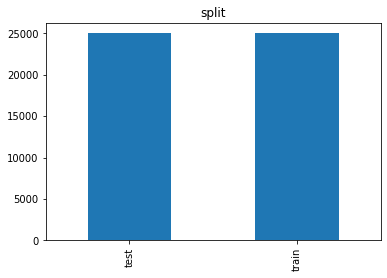

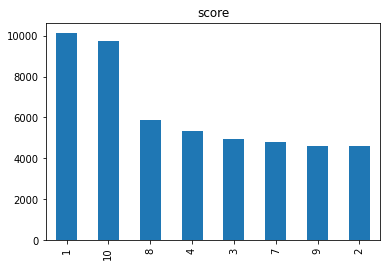

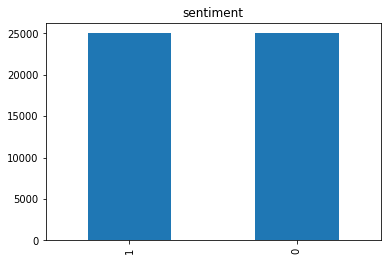

In [ ]:
### YOUR CODE HERE ###
from IPython.display import display
import matplotlib.pyplot as plt

print('Dataset Info:')
print(df.info())
print('\nDataset Head:')
display(df.head())
print('\nSentiment Description:')
display(df.describe())
print('\nScore distinct values:')
print(sorted(df['score'].unique(), key=lambda x: int(x)))
print('\nSentiment distinct values:')
print(df['sentiment'].unique())
print('\nSome plots:')
for i in ['split','score','sentiment']:
    plt.figure()
    print(df[i].value_counts())
    df[i].value_counts().plot(kind='bar', title=i)

### [Optional] A quick simplification

Since the dataset is quite large, the embedding related methods, such as co-occurrence matrix construction, may take a while or may require ad hoc solutions. For instance, if we consider the whole dataset (50k sentences) the vocabulary should be around 160k terms and we don't have sufficient memory to load a (160k, 160k) co-occurrence matrix.

For the purpose of this assignment, we can rely on a small slice of the dataset.
In this way, we can get results in small amount of time. Nonetheless, feel free
to work with the whole dataset! Suggestions on how to handle this scenario are
given below when required.

Select the amount of dataset samples you want to keep and re-define the dataset as follows.

In [ ]:
samples_amount = 500

# This type of slicing is not mandatory,
# but it is sufficient to our purposes
np.random.seed(42)
random_indexes = np.random.choice(np.arange(df.shape[0]),
                                  size=samples_amount,
                                  replace=False)

df = df.iloc[random_indexes]

print('New dataset size: ', df.shape)

New dataset size:  (500, 5)


## Building the Vocabulary

At this point we can build the word vocabulary of our dataset. This information is the first step of any word embedding method: we need to know the set of atomic entities that build up our corpus.

**Definition**: a vocabulary is a collection of words occurring in a given dataset. More precisely, each word is recognized and assigned an index.

**Example**: Suppose you have the given toy corpus $D$: { "the cat is on the table" }

As you notice, the dataset is comprised of only one sentence: "the cat is on the table". The corresponding vocabulary (a possible one) will be:

V = {0: 'the', 1: 'cat', 2: 'is', 3: 'on', 4: 'table'}

In this case, indexing follows word order, but it is not mandatory!

**Important**: The most important thing to remember is that the vocabulary should always be the same one. Thus, make sure that the vocabulary creation routine always returns the same result!



### Some Cleaning

Before vocabulary creation, we have to do a little bit of text pre-processing so as to avoid spurious data.

Pre-processing is always an important step in any machine learning based task, since data quality is one of the crucial factors that lead to better performance. Models, even state-of-the-art ones, hardly achieve satisfying results if the dataset is very noisy.

**Types of pre-processing**: there are a lot of pre-processing steps that we can consider, either general or quite task- specific. Here we will rely on very standard and simple methods.

*    **Text to lower**: casing usually doesn't affect our task, but in some scenarios, such as part-of-speech tagging, might even be crucial.

*    **Replace special characters**: special characters are usually employed as variants of a single character like the spacing symbol ' '. 
In other cases (dates, etc..) special characters might have a specific meaning and should not be replaced.

*    **Text stripping**: it is important to filter out extra spaces to avoid unwanted distinctions between identical words, such as 'apple' and ' apple '.

There are a lot of pre-processing techniques, such as number replacing, lemmatization, stemming, spell correction, acronyms merge and so on. If you are interested you can check [here](https://medium.com/swlh/text-normalization-7ecc8e084e31) and [here](https://www.kdnuggets.com/2019/04/text-preprocessing-nlp-machine-learning.html) some good blogs about the topic.

**NOTE**: If you feel like there should be some additional pre-processing, feel free to modify this section as you please! Please, remember to provide additional comments to motivate your changes.

**Ulterior preprocessing steps have been added**<br>
- < br /> occurrencies have been eliminated
- " 've"s have been converted to " have"
- " 'll"s have been converted to " will"
- " 're" have been converted to " are"
- "I'm" have been converted to "i am"
- "won't" have been converted to "will not"
- "aren't" have been converted to "are not"
- "isn't" have been converted to "is not"
- "don't" have been converted to "do not"
- "doesn't" have been converted to "does not"
- Consecutive lines (corresponding to the character: "-") have been eliminated
- " 's" have been deleted
- "." have been deleted
- Lemmization step has been added

In [ ]:
import re
from functools import reduce
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Config
nltk.download('wordnet')
lemmatizer = WordNetLemmatizer()

HTML_DELETE = re.compile('<br />')
VE_SEPARATE = re.compile('\'ve')
WILL_SEPARATE = re.compile('\'ll')
RE_SEPARATE = re.compile('\'re')
IM_SEPARATE_RE = re.compile('[Ii]\'m')
WONT_SEPARATE_RE = re.compile('won\'t')
ARENT_SEPARATE_RE = re.compile('aren\'t')
ISNT_SEPARATE_RE = re.compile('isn\'t')
DONT_SEPARATE_RE = re.compile('don\'t')
DOESNT_SEPARATE_RE = re.compile('doesn\'t')
LINE_DELETE = re.compile('-+')
S_DELETE = re.compile('\'s')
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;\.]')


GOOD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')

try:
    STOPWORDS = set(stopwords.words('english'))
except LookupError:
    nltk.download('stopwords')
    STOPWORDS = set(stopwords.words('english'))

def lower(text):
    """
    Transforms given text to lower case.
    Example:
    Input: 'I really like New York city'
    Output: 'i really like new your city'
    """

    return text.lower()

def replace_special_characters(text):
    """
    Replaces special characters, such as paranthesis,
    with spacing character
    """
    text = VE_SEPARATE.sub(' have', text)
    text = WILL_SEPARATE.sub(' will', text)
    text = RE_SEPARATE.sub(' are', text)
    text = IM_SEPARATE_RE.sub('i am', text)
    text = WONT_SEPARATE_RE.sub('will not', text)
    text = ARENT_SEPARATE_RE.sub('are not', text)
    text = ISNT_SEPARATE_RE.sub('is not', text)
    text = DONT_SEPARATE_RE.sub('do not', text)
    text = DOESNT_SEPARATE_RE.sub('does not', text)
    text = LINE_DELETE.sub(' ',text)
    text = S_DELETE.sub('', text)
    text = HTML_DELETE.sub(' ', text)
    return REPLACE_BY_SPACE_RE.sub(' ', text)

def filter_out_uncommon_symbols(text):
    """
    Removes any special character that is not in the
    good symbols list (check regular expression)
    """

    return GOOD_SYMBOLS_RE.sub('', text)

def remove_stopwords(text):
    return ' '.join([lemmatizer.lemmatize(x) for x in text.split() if x and x not in STOPWORDS])


def strip_text(text):
    """
    Removes any left or right spacing (including carriage return) from text.
    Example:
    Input: '  This assignment is cool\n'
    Output: 'This assignment is cool'
    """

    return text.strip()

PREPROCESSING_PIPELINE = [
                          lower,
                          replace_special_characters,
                          filter_out_uncommon_symbols,
                          remove_stopwords,
                          strip_text
                          ]

# Anchor method

def text_prepare(text, filter_methods=None):
    """
    Applies a list of pre-processing functions in sequence (reduce).
    Note that the order is important here!
    """

    filter_methods = filter_methods if filter_methods is not None else PREPROCESSING_PIPELINE

    return reduce(lambda txt, f: f(txt), filter_methods, text)

# Pre-processing

print('Pre-processing text...')

print()
print('[Debug] Before:\n{}'.format(df.text[:3]))
print()

# Replace each sentence with its pre-processed version
df['text'] = df['text'].apply(lambda txt: text_prepare(txt))

print('[Debug] After:\n{}'.format(df.text[:3]))
print()

print("Pre-processing completed!")

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
Pre-processing text...

[Debug] Before:
33553    <br /><br />eXistenZ is simply David Cronenber...
9427     A true classic. Beautifully filmed and acted. ...
199      Low budget Brit pop melodrama focuses on a gir...
Name: text, dtype: object

[Debug] After:
33553    existenz simply david cronenberg best movie pe...
9427     true classic beautifully filmed acted reveals ...
199      low budget brit pop melodrama focus girl want ...
Name: text, dtype: object

Pre-processing completed!


### **Vocabulary Creation**

We are now ready to create the vocabulary! This task is up to you! Complete the below function and remember to follow mentioned requirements.

FYI, since the text has been pre-processed, space splitting should work correctly. 

Bare in mind that some packages offers tools for automatic vocabulary creation, such as Keras (check [keras.preprocessing.text.Tokenizer](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/text/Tokenizer)). 

**NOTE**: It is not mandatory to use the keras Tokenizer, we mention it so that you know there exist tools specific for this step.

**NOTE**: In this case, the vocabulary will start from index equal to 1, since the 0 slot is reserved to padding token. In order to pass vocabulary evaluation, you have to re-scale the vocabulary such that the first index is 0.

**NOTE**: If you are using the keras Tokenizer, remember to use its method <code> texts_to_sequences </code> for splitting, otherwise you might find terms that are not in the vocabulary! Please, check also its constructor argument <code> filters </code> since it defines a pre-processing regexp.

This easy task is just to let you know that is important to check the built vocabulary just to make sure everything is ok.

In [ ]:
from collections import OrderedDict
from nltk import word_tokenize

# Function definition
def tokenize(tokenizer=None):
    if tokenizer is None:
        f = lambda x: x.split()
    if tokenizer == 'nltk':
        nltk.download('punkt')
        f = lambda x: word_tokenize(x)
    return f
    

def build_vocabulary(df):
    """
    Given a dataset, builds the corresponding word vocabulary.

    :param df: dataset from which we want to build the word vocabulary (pandas.DataFrame)
    :return:
      - word vocabulary: vocabulary index to word
      - inverse word vocabulary: word to vocabulary index
      - word listing: set of unique terms that build up the vocabulary
    """
    ### YOUR CODE HERE ###
    df_text = df['text']
    df_text = df_text.apply(tokenize())

    word_listing = pd.Series([text for entry in df_text.values for text in entry]).unique()
    idx_and_word = list(enumerate(word_listing))
    idx_to_word = dict(idx_and_word)
    word_to_idx = dict([(text, idx) for idx, text in idx_and_word])
    return idx_to_word, word_to_idx, word_listing


# Testing
idx_to_word, word_to_idx, word_listing = build_vocabulary(df)

print('\n[Debug] Index -> Word vocabulary size: {}'.format(len(idx_to_word)))
print('[Debug] Word -> Index vocabulary size: {}'.format(len(word_to_idx)))

print('[Debug] Some words: {}'.format([(idx_to_word[idx], idx) for idx in np.arange(10) + 1]))

# Evaluation

def evaluate_vocabulary(idx_to_word, word_to_idx, word_listing, df, check_default_size=False):

    # Check size
    print("[Vocabulary Evaluation] Size checking...")

    assert len(idx_to_word) == len(word_to_idx)
    assert len(idx_to_word) == len(word_listing)

    # Check content
    print("[Vocabulary Evaluation] Content checking...")

    for i in tqdm(range(0, len(idx_to_word))):
        assert idx_to_word[i] in word_to_idx
        assert word_to_idx[idx_to_word[i]] == i

    # Check consistency
    print("[Vocabulary Evaluation] Consistency checking...")

    _, _, first_word_listing = build_vocabulary(df)
    _, _, second_word_listing = build_vocabulary(df)
    assert (first_word_listing == second_word_listing).all()

    # Check toy example
    print("[Vocabulary Evaluation] Toy example checking...")
    toy_df = pd.DataFrame.from_dict({
        'text': ["all that glitters is not gold", "all in all i like this assignment"]
    })
    _, _, toy_word_listing = build_vocabulary(toy_df)
    toy_valid_vocabulary = set(' '.join(toy_df.text.values).split())
    assert set(toy_word_listing) == toy_valid_vocabulary


print("Vocabulary evaluation...")
evaluate_vocabulary(idx_to_word, word_to_idx, word_listing, df)
print("Evaluation completed!") 

100%|██████████| 11380/11380 [00:00<00:00, 1961904.70it/s]


[Debug] Index -> Word vocabulary size: 11380
[Debug] Word -> Index vocabulary size: 11380
[Debug] Some words: [('simply', 1), ('david', 2), ('cronenberg', 3), ('best', 4), ('movie', 5), ('people', 6), ('compare', 7), ('matrix', 8), ('even', 9), ('similar', 10)]
Vocabulary evaluation...
[Vocabulary Evaluation] Size checking...
[Vocabulary Evaluation] Content checking...
[Vocabulary Evaluation] Consistency checking...
[Vocabulary Evaluation] Toy example checking...
Evaluation completed!


Feel free to inspect the vocabulary! To this purpose, you can use the following code space.

In [ ]:
### YOUR CODE HERE ###
def inspect_slice(word_listing, start, end):
    start = start if start>=0 else 0
    end = end if end>start else start+1
    end = end if end<=len(word_listing) else len(word_listing)
    return word_listing[start:end]

print(inspect_slice(word_listing,100,200))

['vega' 'small' 'store' 'whilst' 'researching' 'potential' 'independent'
 'dubious' 'first' 'ten' 'minute' 'really' 'started' 'enjoy' 'show'
 'positive' 'attitude' 'change' 'anything' 'contain' 'complex' 'plot'
 'easy' 'follow' 'lift' 'saddest' 'mood' 'smile' 'way' 'without' 'need'
 'petty' 'clich' 'romance' 'includes' 'clutch' 'side' 'laughter' 'rare'
 'masterpiece' 'man' 'lousy' 'deserve' 'comment' 'keeping' 'brief'
 'rebecca' 'demornay' 'highly' 'disciplined' 'police' 'psychiatrist'
 'fall' 'latin' 'lover' 'antonio' 'banderas' 'wine' 'ponytail' 'jail'
 'house' 'tat' 'cut' 'loose' 'torrid' 'affair' 'admit' 'speed' 'bump'
 'pretty' 'cold' 'fish' 'broke' 'ailing' 'father' 'year' 'boot' 'also'
 'adept' 'horny' 'upstairs' 'neighbor' 'dennis' 'miller' 'bay' 'prisoner'
 'harry' 'dean' 'stanton' 'trying' 'maneuver' 'giving' 'diagnosis'
 'multiple' 'personality' 'disorder' 'private' 'nailed' 'wall' 'serial']


### **Save the vocabulary**

Generally speaking, it is a good idea to save the dictionary in clear format. In this way you can quickly check for errors or useful words.

In this case, we will save the vocabulary dictionary in JSON format.

In [ ]:
!pip install simplejson
import simplejson as sj

vocab_path = os.path.join(os.getcwd(), 'Datasets', dataset_name, 'vocab.json')

print("Saving vocabulary to {}".format(vocab_path))
with open(vocab_path, mode='w') as f:
    sj.dump(word_to_idx, f, indent=4)
print("Saving completed!")

Saving vocabulary to /content/Datasets/aclImdb/vocab.json
Saving completed!


## Building the Co-occurence Matrix

As we said at the beginning, embedding methods are based on the principle that similar words will be used in similar contexts. Thus, context information is crucial to determine the meaning of a word.

One basic approach, which falls under the category of sparse representations, is the **co-occurrence matrix**: for each word in the vocabulary we count the number of times each other word appears within the same context window. A simple example is given by image below.

![](https://drive.google.com/uc?export=view&id=1UknGoYvIBBA7ytkSlqm1NhF_lHt0iOwT)

In particular, the context window defines our notion of word context. Consider the following example:

<h3><center> The cat is on the table </center></h3>

We have to consider each word in the sentence and for each we have count words within the context window. Suppose a window of size 2, then we have for the word 'cat':

Current word: cat

Context words: [the, is, on]

Notice how we consider $W$ words back and ahead of current word, where $W$ is the window size.




Let's define the simplest version of a **co-occurrence matrix** based on word counting.

---

**Small dataset case**: If you selected a small slice of the dataset, you should have a vocabulary size that we can afford in terms of memory demand. Thus, you can easily instantiate the co-occurrence matrix and populate it iteratively.

---

**Large dataset case**: We have to work with sparse matrices due to the high vocabulary size and to the low amount of non-zero word counts. To this end, the [Scipy package](https://docs.scipy.org/doc/scipy/reference/sparse.html) allows us to easily define sparse matrices that can be converted ot numpy arrays (if we can).

**Suggestion**: The simplest way to build the co-occurrence matrix is via an incremental approach: we loop through dataset sentences, split into words and then count co-occurrences within the given window frame. Generally, combining this approach with sparse matrices is not so efficient (yet possible). However, Scipy offers [$\texttt{lil_matrix}$](https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.lil_matrix.html#scipy.sparse.lil_matrix) sparse format that is suitable to this case. Anyway, check out other sparse formats, such as [$\texttt{csr_matrix}$](https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.csr_matrix.html#scipy.sparse.csr_matrix), and the corresponding building methods.

Working with $\texttt{lil_matrix}$ might take $\sim 1h$ of time to build the whole dataset co-occurrence matrix. It is also possibile to work with $\texttt{csr_matrix}$ but the approach is more complex (check the last example of the corresponding documentation page).


In [ ]:
import scipy.sparse    # defines several types of efficient sparse matrices
import zipfile
import gc
import requests
import time

# Function definition

def co_occurrence_count(df, idx_to_word, word_to_idx, window_size=4, matrix_type='csr_matrix'):
    """
    Builds word-word co-occurrence matrix based on word counts.

    :param df: pre-processed dataset (pandas.DataFrame)
    :param idx_to_word: vocabulary map (index -> word) (dict)
    :param word_to_idx: vocabulary map (word -> index) (dict)
    :param matrix_type: type of the output matrix

    :return
      - co_occurrence symmetric matrix of size |V| x |V| (|V| = vocabulary size)
    """

    ### YOUR CODE HERE ###
    cmat = np.zeros((len(idx_to_word),len(idx_to_word)))

    for text in tqdm(df['text'].apply(tokenize())):
        #Initializing the window before the first word (empty)
        window_before = []
        #Initializing the window after the first word
        window_after = []
        num_words = len(text)
        for idx in range(window_size):
            if idx < num_words-1:
                window_after.append(text[idx+1])
            
        #Build co-occurence matrix
        for idx, word in enumerate(text):
            if word in word_to_idx:
                #Update co-occurence matrix
                for word_window in window_before+window_after:
                    if word_window in word_to_idx:
                        cmat[word_to_idx[word], word_to_idx[word_window]] += 1 

        #Updating the window before the current word
            window_before.append(word)
            if len(window_before) > window_size:
                window_before.pop(0)

            #Updating the window after the current word
            if len(window_after) > 0:
                window_after.pop(0)
            if idx < num_words-window_size-1:
                window_after.append(text[idx+window_size+1])

    if matrix_type == 'lil_matrix':
        cmat = scipy.sparse.lil_matrix(cmat)
    elif matrix_type == 'csr_matrix':
        cmat = scipy.sparse.csr_matrix(cmat)

    return cmat

            


# Testing
window_size = 4

# Clean RAM before re-running this code snippet to avoid session crash
if 'co_occurrence_matrix' in globals():
    del co_occurrence_matrix
    gc.collect()
    time.sleep(10.)

print("Building co-occurrence count matrix... (it may take a while...)")
co_occurrence_matrix = co_occurrence_count(df, idx_to_word, word_to_idx, window_size)
print("Building completed!")


# Evaluation

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)

def download_toy_data(benchmark_path):
    toy_data_path = os.path.join(benchmark_path, 'co-occurrence_count_benchmark.zip')
    toy_data_url_id = "1z8qp034utvW7kv-9Q_TACJv3_sdCzkZg"
    toy_url = "https://docs.google.com/uc?export=download"

    if not os.path.exists(benchmark_path):
        os.makedirs(benchmark_path)

    if not os.path.exists(toy_data_path):
        print("Downloading co-occurrence count matrix benchmark data...")
        with requests.Session() as current_session:
            response = current_session.get(toy_url,
                                   params={'id': toy_data_url_id},
                                   stream=True)
        save_response_content(response, toy_data_path)
        print("Download complete!")

        print("Extracting dataset...")
        with zipfile.ZipFile(toy_data_path) as loaded_zip:
            loaded_zip.extractall(benchmark_path)
        print("Extraction complete!")

def evaluate_co_occurrence_matrix(matrix):
    is_sparse = False

    if hasattr(scipy.sparse, type(matrix).__name__):
        print("Detected sparse co-occurrence matrix!")
        is_sparse = True

    # Check symmetry
    print("[Co-occurrence count matrix Evaluation] Symmetry checking...")
    if is_sparse:
        assert (matrix != matrix.transpose()).nnz == 0
    else:
        assert np.equal(matrix, matrix.transpose()).all()

    # Check toy example
    print("[Co-occurrence count matrix Evaluation] Toy example checking...")
    toy_df = pd.DataFrame.from_dict({
        'text': ["all that glitters is not gold",
                 "all in all i like this assignment"],
    })
    benchmark_path = os.path.join(os.getcwd(), 'Benchmark')
    toy_path = os.path.join(benchmark_path, 'co-occurrence_count_benchmark')
    download_toy_data(benchmark_path)

    toy_idx_to_word = np.load(os.path.join(toy_path, 'toy_idx_to_word.npy'), allow_pickle=True).item()
    toy_word_to_idx = np.load(os.path.join(toy_path, 'toy_word_to_idx.npy'), allow_pickle=True).item()

    toy_matrix = co_occurrence_count(toy_df, toy_idx_to_word, toy_word_to_idx, window_size=1)
    toy_valid_matrix = np.load(os.path.join(toy_path, 'toy_co_occurrence_matrix_count.npy'))

    if is_sparse:
        assert np.equal(toy_matrix.todense(), toy_valid_matrix).all()
    else:
        assert np.equal(toy_matrix, toy_valid_matrix).all()


print("Evaluating co-occurrence matrix")
evaluate_co_occurrence_matrix(co_occurrence_matrix)
print("Evaluation completed!")

Building co-occurrence count matrix... (it may take a while...)


100%|██████████| 2/2 [00:00<00:00, 2167.60it/s]

Building completed!
Evaluating co-occurrence matrix
Detected sparse co-occurrence matrix!
[Co-occurrence count matrix Evaluation] Symmetry checking...
[Co-occurrence count matrix Evaluation] Toy example checking...
Evaluation completed!


### **Got Stuck?**

If you are stuck, but still want to try out following sections, you can experiment with a valid co-occurrence matrix provided by us as follows

In [ ]:
'''
benchmark_path = os.path.join(os.getcwd(), 'Benchmark')
valid_data_benchmark_path = os.path.join(benchmark_path, 'co-occurrence_count_benchmark', "{}.npy")

download_toy_data(benchmark_path)

co_occurrence_matrix = np.load(valid_data_benchmark_path.format('valid_co-occurrence_matrix_count'))
idx_to_word = np.load(valid_data_benchmark_path.format('valid_idx_to_word'), allow_pickle=True).item()
word_to_idx = np.load(valid_data_benchmark_path.format('valid_word_to_idx'), allow_pickle=True).item()
word_listing = np.load(valid_data_benchmark_path.format('valid_word_listing'))

print('Co-occurrence matrix shape: ', co_occurrence_matrix.shape)
print('Index -> word vocabulary size: ', len(idx_to_word))
print('Word -> index vocabulary size: ', len(word_to_idx))
print('Word listing size: ', len(word_listing))
'''

'\nbenchmark_path = os.path.join(os.getcwd(), \'Benchmark\')\nvalid_data_benchmark_path = os.path.join(benchmark_path, \'co-occurrence_count_benchmark\', "{}.npy")\n\ndownload_toy_data(benchmark_path)\n\nco_occurrence_matrix = np.load(valid_data_benchmark_path.format(\'valid_co-occurrence_matrix_count\'))\nidx_to_word = np.load(valid_data_benchmark_path.format(\'valid_idx_to_word\'), allow_pickle=True).item()\nword_to_idx = np.load(valid_data_benchmark_path.format(\'valid_word_to_idx\'), allow_pickle=True).item()\nword_listing = np.load(valid_data_benchmark_path.format(\'valid_word_listing\'))\n\nprint(\'Co-occurrence matrix shape: \', co_occurrence_matrix.shape)\nprint(\'Index -> word vocabulary size: \', len(idx_to_word))\nprint(\'Word -> index vocabulary size: \', len(word_to_idx))\nprint(\'Word listing size: \', len(word_listing))\n'

## Embedding Visualization

The next step is to visualize our sparse word embeddings in a lower dimensional space (2D) in order to have an idea of the meaning attributed to each word.

**How?** Well, there are some dimensionality reduction techniques that we might employ. We will explore SVD and t-SNE methods, without delving into technical details since they are not arguments of this NLP course.

**SVD Memo**: SVD stands for **Singular Value Decomposition** and is a kind of generalized **Principal Components Analysis** (PCA) and focuses on selecting the top **k** principal components. For more info, [here](https://davetang.org/file/Singular_Value_Decomposition_Tutorial.pdf) you can find a brief tutorial.

**t-SNE Memo**: t-SNE stands for **t-Distributed Stochastic Neighbour Embedding** and is an unsupervised non-linear technique. The non-linearity is one major point of difference with PCA. Additionally, it preserves small pairwise distance (or local similarities), whereas PCA aims to preserve large pairwise distances in order to maximize variance. The basic idea of t-SNE is to compute a similarity measure between a pair of instances both at high and low dimensional space and optimize these two similarities via a cost function. Properly using t-SNE is a bit tricky, a well recommended reading is one of the [author's blog](https://lvdmaaten.github.io/tsne/).

**Note**: We strongly suggest you to play with the window size and check if there are some notable differences. Generally, a small window size reflects syntactic properties, while a large window size captures semantic ones.

In [ ]:
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt

# Function definition

def visualize_embeddings(embeddings, word_annotations=None, word_to_idx=None):
    """
    Plots given reduce word embeddings (2D).
    Users can highlight specific words (word_annotations list) in order to better
    analyse the effectiveness of the embedding method.

    :param embeddings: word embedding matrix of shape (words, 2) retrieved via a
                       dimensionality reduction technique.
    :param word_annotations: list of words to be annotated.
    :param word_to_idx: vocabulary map (word -> index) (dict)
    """

    fig, ax = plt.subplots(1, 1, figsize=(15, 12))

    if word_annotations:
        print("Annotating words: {}".format(word_annotations))

        word_indexes = []
        for word in word_annotations:
            word_index = word_to_idx[word]
            word_indexes.append(word_index)

        word_indexes = np.array(word_indexes)

        other_embeddings = embeddings[np.setdiff1d(np.arange(embeddings.shape[0]), word_indexes)]
        target_embeddings = embeddings[word_indexes]

        ax.scatter(other_embeddings[:, 0], other_embeddings[:, 1], alpha=0.1, c='blue')
        ax.scatter(target_embeddings[:, 0], target_embeddings[:, 1], alpha=1.0, c='red')
        ax.scatter(target_embeddings[:, 0], target_embeddings[:, 1], alpha=1, facecolors='none', edgecolors='r', s=1000)

        for word, word_index in zip(word_annotations, word_indexes):
            word_x, word_y = embeddings[word_index, 0], embeddings[word_index, 1]
            ax.annotate(word, xy=(word_x, word_y))

    else:
        ax.scatter(embeddings[:, 0], embeddings[:, 1], alpha=0.1, c='blue')

    # Set proper axis limit range
    # We avoid outliers ruining the visualization if they are quite far away
    xmin_quantile = np.quantile(embeddings[:, 0], q=0.01)
    xmax_quantile = np.quantile(embeddings[:, 0], q=0.99)

    ymin_quantile = np.quantile(embeddings[:, 1], q=0.01)
    ymax_quantile = np.quantile(embeddings[:, 1], q=0.99)

    ax.set_xlim(xmin_quantile, xmax_quantile)
    ax.set_ylim(ymin_quantile, ymax_quantile)


def reduce_SVD(embeddings):
    """
    Applies SVD dimensionality reduction.

    :param embeddings: word embedding matrix of shape (words, dim). In the case
                       of a word-word co-occurrence matrix the matrix shape would
                       be (words, words).

    :return
        - 2-dimensional word embedding matrix of shape (words, 2)
    """
  
    print("Running SVD reduction method...")
    svd = TruncatedSVD(n_components=2, n_iter=10, random_state=42)
    reduced = svd.fit_transform(embeddings)
    print("SVD reduction completed!")

    return reduced

# Note: this method may take a while
def reduce_tSNE(embeddings):
    """
    Applies t-SNE dimensionality reduction.

    :param embeddings: word embedding matrix of shape (words, dim). In the case
                       of a word-word co-occurrence matrix the matrix shape would
                       be (words, words).

    :return
        - 2-dimensional word embedding matrix of shape (words, 2)
    """

    print("Running t-SNE reduction method... (it may take a while...)")
    tsne = TSNE(n_components=2, random_state=42, n_iter=1000, metric='cosine', n_jobs=2)
    reduced = tsne.fit_transform(embeddings)
    print("t-SNE reduction completed!")

    return reduced

Running SVD reduction method...
SVD reduction completed!
Annotating words: ['good', 'love', 'beautiful']
Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']


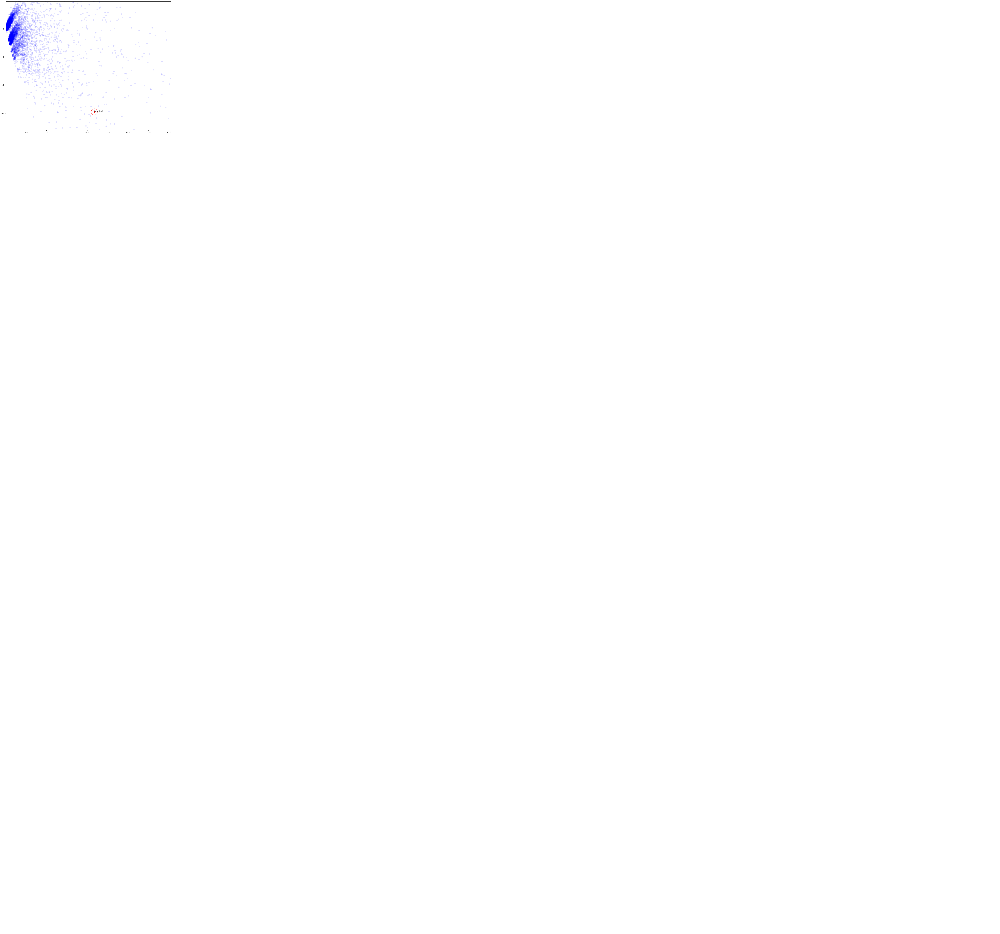

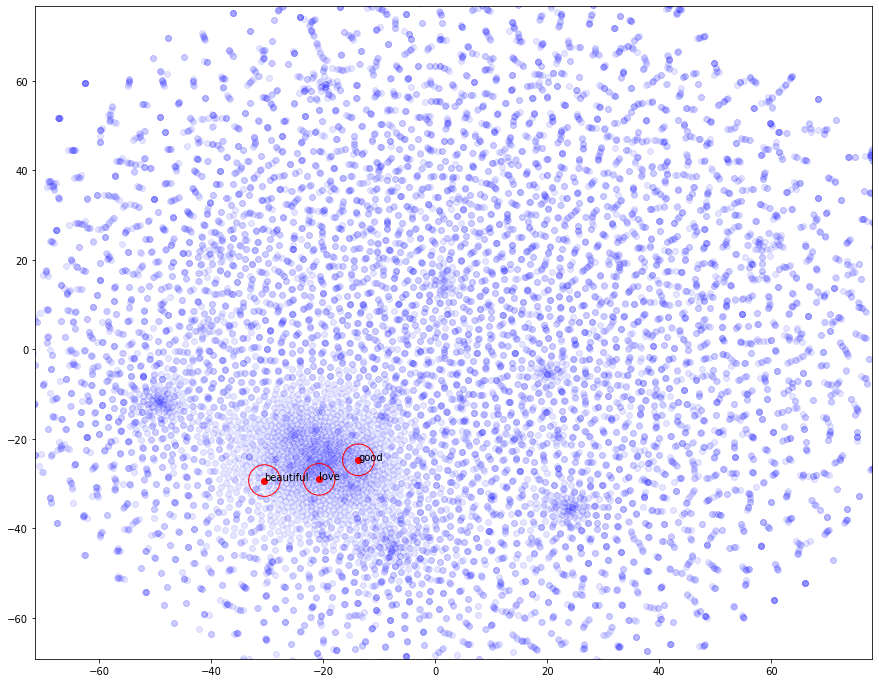

In [ ]:
# Testing

# Feel free to play with word_annotations argument!
# Some suggestions: stopwords (if not removed), nouns, adjectives
# Check the saved dictionary!

# SVD
reduced_SVD = reduce_SVD(co_occurrence_matrix)
visualize_embeddings(reduced_SVD, ['good', 'love', 'beautiful'], word_to_idx)

# t-SNE
# Note: this method may take a while (just relax :-))
reduced_tSNE = reduce_tSNE(co_occurrence_matrix)
visualize_embeddings(reduced_tSNE, ['good', 'love', 'beautiful'], word_to_idx)

plt.show()

Feel free to play with visualization!

Let's create two co-occurence matrices with smaller and larger context window's size

In [ ]:
### YOUR CODE HERE ###
if 'cmat_smallw' in globals():
    print('Deallocating cmat_smallw ...')
    del cmat_smallw
    gc.collect()
    time.sleep(10.)
    print('Done\n')

if 'cmat_bigw' in globals():
    print('Deallocating cmat_bigw ...')
    del cmat_bigw
    gc.collect()
    time.sleep(10.)
    print('Done\n')


cmat_smallw = co_occurrence_count(df, idx_to_word, word_to_idx, 1)
cmat_bigw = co_occurrence_count(df, idx_to_word, word_to_idx, 7)

100%|██████████| 500/500 [00:00<00:00, 677.44it/s]


Let's now see how the visualization of the two matrices just created differ from ```co_occurrence_matrix```



Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']


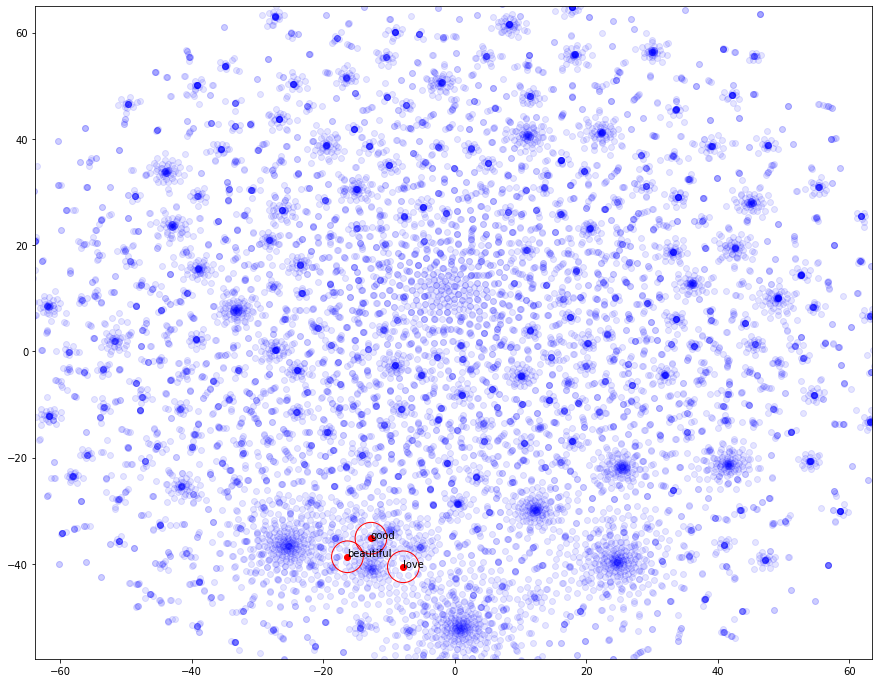

In [ ]:
### YOUR CODE HERE ###
reduced_tSNE_smallw = reduce_tSNE(cmat_smallw)
visualize_embeddings(reduced_tSNE_smallw, ['good', 'love', 'beautiful'], word_to_idx)
plt.show()

Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']


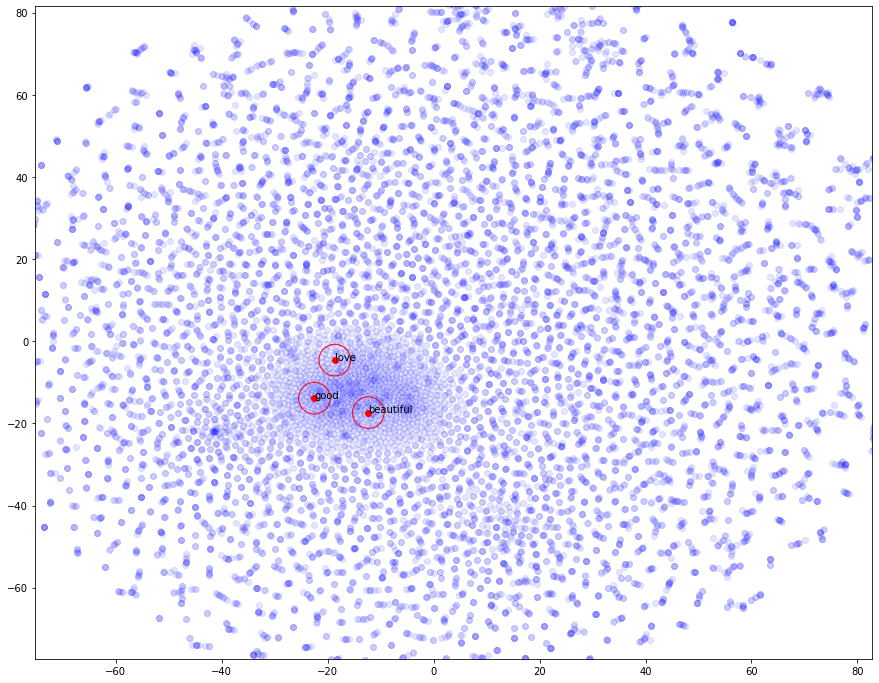

In [ ]:
reduced_tSNE_bigw = reduce_tSNE(cmat_bigw)
visualize_embeddings(reduced_tSNE_bigw, ['good', 'love', 'beautiful'], word_to_idx)
plt.show()

### Embedding properties

Visualization can give us a rough idea of how word embeddings are organized and if some semantic properties are reflected in the numerical dimensional space. For example, are synonyms close together? Ideally, if the dataset is big enough, we should see similar vector embeddings since synonyms usually have similar contexts.

**How to do that?** We could highlight target words in the visualization step and check if our expectations are met. For instance, synonyms should be close together. However, this method is rather inaccurate and time-consuming (dimensionality reduction is not a perfect mapping). Thus, we need some sort of similarity metric that is independent of the vector dimensionality.

#### **Cosine Similarity**

Let us now consider again the matrix obtained using <code>co_occurrence_count</code>. 
Since we want to meaure how two word vectors are far apart, a naive solution would involve computing the dot product of the two vectors. However, this metric will give higher similarity either to longer vectors or to vectors that have higher counts.

A better metric is **cosine similarity** which is just a normalized dot product.

$s(p, q) = \frac{p \, \cdot \, q}{||p|| \, \cdot \, ||q||}$

where $s(p, q) \in [-1, 1] $, since it computes the cosine of the angle between the two vectors. Intuitively, we are bringing vectors down to the d-dimensional unit sphere (d is the vocab size) and then computing their distance (in 2D space we will have a circle).

Now, write down the cosine similarity formula so that we can proceed testing word embedding properties!

**NOTE**: Since we are working with matrices, we will ask you to define a cosine similarity function that works with matrices. Extending to matrices is quite easy if you think them as lists of vectors.

**NOTE**: It is permitted to use functions of existing packages (e.g. sci-kit learn). This is mainly for efficiency motivation. We are not going to discriminate between such solutions and the ones that manually implement the cosine similarity metric (since it is not the main objective of the assignment).

**WHAT YOU HAVE TO DO**: First of all, try to manually define the cosine similarity operation. If your implementation is correct but not so efficient, you can define a separate cosine similarity function that leverages implementations of existing packages like sci-kit learn. Here we want to verify if you understand the metric, but at the same time we don't want to penalize you if you are not as efficient as possible (although it is one factor that it is important to not forget when coding in general).

In [ ]:
# Function definition
from sklearn.metrics.pairwise import cosine_similarity as sklearn_cosine

def cosine_similarity(p, q, transpose_p=False, transpose_q=False, method=None):
    """
    Computes the cosine similarity of two d-dimensional matrices

    :param p: d-dimensional vector (np.ndarray) of shape (p_samples, d)
    :param q: d-dimensional vector (np.ndarray) of shape (q_samples, d)
    :param transpose_p: whether to transpose p or not
    :param transpose_q: whether to transpose q or not
    :param method: method to use to compute the cosine similarity

    :return
        - cosine similarity matrix S of shape (p_samples, q_samples)
          where S[i, j] = s(p[i], q[j])
    """

    # If it is a vector, consider it as a single sample matrix
    if len(p.shape) == 1:
        p = p.reshape(1, -1)
    if len(q.shape) == 1:
        q = q.reshape(1, -1)

    ### YOUR CODE HERE ###
    if type(q) != type(p):
        q = type(p)(q)

    if method is None:
        if transpose_p:
            p = p.T
        if transpose_q:
            q = q.T
        sparse_matrix = hasattr(scipy.sparse, type(p).__name__)

        #Selection of the norm function
        norm_function = np.linalg.norm if not sparse_matrix else scipy.sparse.linalg.norm
        norm_p = norm_function(p, axis=1)[:,None]
        norm_q = norm_function(q, axis=0)[:,None]
        norm_pq = norm_p @ norm_q.T if not sparse_matrix else norm_p.dot(norm_q.T)

        pq_dot_product = p @ q if not sparse_matrix else p.dot(q)

        S = np.divide(pq_dot_product, norm_pq) if not sparse_matrix else pq_dot_product/norm_pq

        S = np.asarray(S) if sparse_matrix else S
        return S

    elif method == 'sklearn':
        return sklearn_cosine(p,q)

    return None

# Testing

print("Computing similarity matrix...")
similarity_matrix = cosine_similarity(co_occurrence_matrix,
                                      co_occurrence_matrix,
                                      transpose_q=True)
print('type(similarity_matrix) =',type(similarity_matrix))
print("Similarity completed!")

# Evaluation

def sparse_allclose(a, b, rtol=1e-5, atol = 1e-8):
    c = np.abs(np.abs(a - b) - rtol * np.abs(b))
    return c.max() <= atol

def evaluate_cosine_similarity(similarity_matrix):

    # Vector similarity
    print('[Cosine similarity Evaluation] Vector similarity check...')

    p = np.array([5., 6., 0.3, 1.])
    q = np.array([50., 6., 0., 0.])
    assert np.allclose([[0.72074324]], cosine_similarity(p, q, transpose_q=True))

    # Matrix similarity
    print('[Cosine similarity Evaluation] Matrix similarity check...')

    toy_matrix = np.array([5., 6., 0.3, 1.,
                           50., 6., 0., 0.,
                           0., 100., 20., 4.]).reshape(3, 4)
    true_matrix = np.array([1., 0.72074324, 0.75852259,
                            0.72074324, 1., 0.11674173,
                            0.75852259, 0.11674173, 1.]).reshape(3, 3)
    proposed_matrix = cosine_similarity(toy_matrix, toy_matrix, transpose_q=True)
    
    assert np.allclose(proposed_matrix, true_matrix)

    # There might be some numerical error that invalidates the np.equal check
    assert np.allclose(proposed_matrix, proposed_matrix.transpose())

    # Check symmetry
    print("[Cosine similarity Evaluation] Symmetry checking...")

    is_sparse = False

    if hasattr(scipy.sparse, type(similarity_matrix).__name__):
        print("Detected sparse cosine similarity matrix!")
        is_sparse = True

    if is_sparse:
        try:
            assert (similarity_matrix != similarity_matrix.transpose()).nnz == 0
        except AssertionError:
            assert sparse_allclose(similarity_matrix, similarity_matrix.transpose())
    else:
        # There might be some numerical error that invalidates the np.equal check
        assert np.allclose(similarity_matrix, similarity_matrix.transpose())

print('Evaluating cosine similarity...')
evaluate_cosine_similarity(similarity_matrix)
print('Evaluation completed!')

Computing similarity matrix...
type(similarity_matrix) = <class 'numpy.ndarray'>
Similarity completed!
Evaluating cosine similarity...
[Cosine similarity Evaluation] Vector similarity check...
[Cosine similarity Evaluation] Matrix similarity check...
[Cosine similarity Evaluation] Symmetry checking...
Evaluation completed!


#### **[Let's play!] Synonyms and Antonyms**

Look for some words and provide a possible explanation of achieved results according to cosine similarity metric (you can also refer to previous visualization step).

* Synonym pair: (w1, w2) such that w1 and w2 are synonyms
* Antonyms pair: (w1, w2) such that w1 and w2 are antonyms
* Synonym-Antonym triplet: (w1, w2, w3) such that w1 and w2 are synonyms and w1 and w3 are antonyms

You can also support your answer by checking word contexts of selected words.

In [ ]:
### YOUR CODE HERE  ###
from operator import itemgetter

def count(word_syn):
    def fun(tokens):
        c = 0
        for word in tokens:
            if word == word_syn:
                c += 1
        return c
    return fun

def get_mat_val(word, word_list, word_to_idx, mat):
    return dict([(w,mat[word_to_idx[word],word_to_idx[w]]) for w in word_list])


def info_words(word_list, word_to_idx, cmat, smat):
    for word in word_list:
        print('Word:',word)
        print('Number of occurences: {}'.format(df['text'].apply(tokenize()).apply(count(word)).sum()))
        print('Number of co-occurences: {}'.format(get_mat_val(word, word_list, word_to_idx, cmat)))
        print('Similarities: {}'.format(get_mat_val(word, word_list, word_to_idx, smat)),'\n')


def show_embeddings(reduced_tSNE, token_list, word_to_idx, cmat, smat=None, verbose=True):
    if smat is None:
        smat = cosine_similarity(cmat, cmat, transpose_q=True)

    print('='*40)
    print('Start plotting embeddings\n\n')
    for tl in token_list:
        tl = [token for token in tl if token in word_to_idx]

        visualize_embeddings(reduced_tSNE, tl, word_to_idx)
        print()
        if verbose:
            info_words(tl, word_to_idx, cmat, smat)
        plt.show()
        print()


syn_ant_list = [
    ['movie', 'film', 'movies', 'films',],
    ['women', 'girls', 'woman', 'girl'],
    ['boring', 'dull', 'monotonous','uninteresting','bright','exciting','interesting'],
    ['wonderful', 'good', 'bad', 'horrid'],
]

In [ ]:
### YOUR CODE HERE ###
reduced_tSNE_syn_ant = reduce_tSNE(similarity_matrix)

Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!


Start plotting embeddings


Annotating words: ['movie', 'film']

Word: movie
Number of occurences: 1089
Number of co-occurences: {'movie': 156.0, 'film': 47.0}
Similarities: {'movie': 0.9999999999999998, 'film': 0.8452710371889636} 

Word: film
Number of occurences: 908
Number of co-occurences: {'movie': 47.0, 'film': 90.0}
Similarities: {'movie': 0.8452710371889636, 'film': 1.0000000000000002} 



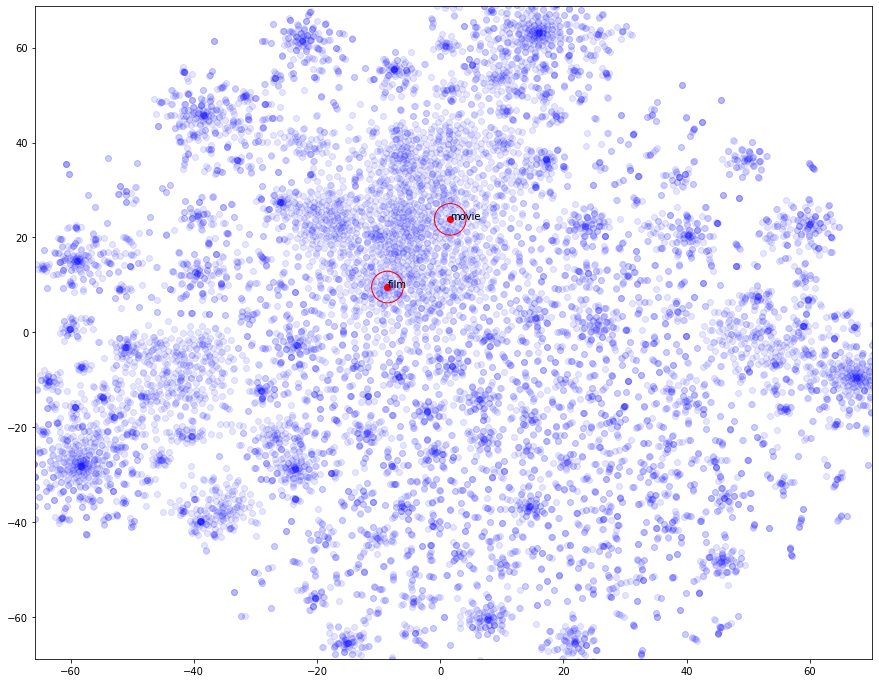


Annotating words: ['woman', 'girl']

Word: woman
Number of occurences: 78
Number of co-occurences: {'woman': 4.0, 'girl': 2.0}
Similarities: {'woman': 1.0, 'girl': 0.4205868209221122} 

Word: girl
Number of occurences: 95
Number of co-occurences: {'woman': 2.0, 'girl': 4.0}
Similarities: {'woman': 0.4205868209221122, 'girl': 1.0} 



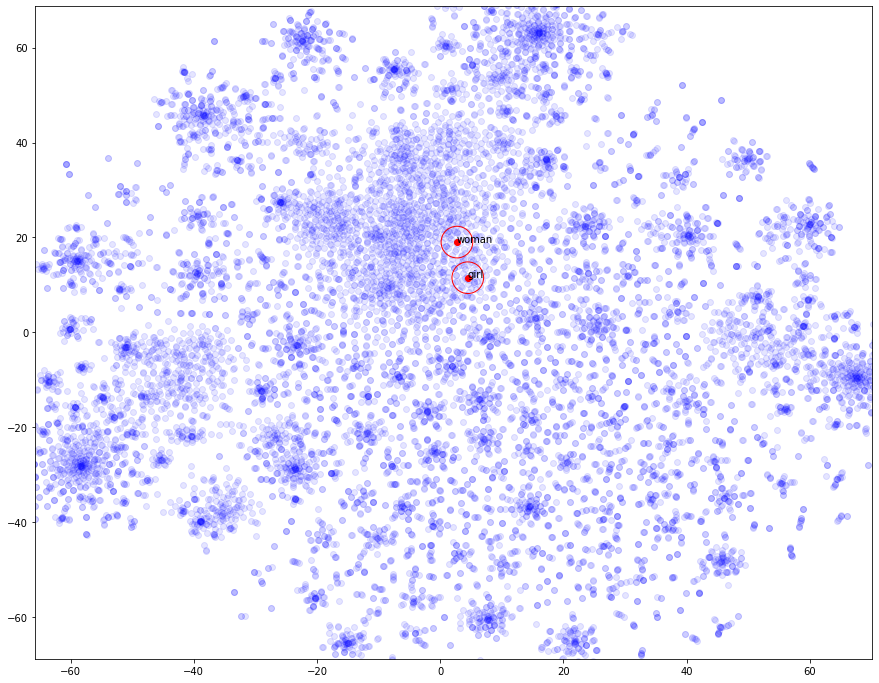


Annotating words: ['boring', 'dull', 'uninteresting', 'bright', 'exciting', 'interesting']

Word: boring
Number of occurences: 38
Number of co-occurences: {'boring': 0.0, 'dull': 3.0, 'uninteresting': 0.0, 'bright': 0.0, 'exciting': 0.0, 'interesting': 1.0}
Similarities: {'boring': 0.9999999999999999, 'dull': 0.28541481360118115, 'uninteresting': 0.18545863274217977, 'bright': 0.09122892974315043, 'exciting': 0.07205877781739882, 'interesting': 0.4134004230203604} 

Word: dull
Number of occurences: 17
Number of co-occurences: {'boring': 3.0, 'dull': 0.0, 'uninteresting': 0.0, 'bright': 1.0, 'exciting': 0.0, 'interesting': 1.0}
Similarities: {'boring': 0.28541481360118115, 'dull': 1.0, 'uninteresting': 0.13679711361135385, 'bright': 0.10814761408717502, 'exciting': 0.05580923521074299, 'interesting': 0.36958076143316515} 

Word: uninteresting
Number of occurences: 3
Number of co-occurences: {'boring': 0.0, 'dull': 0.0, 'uninteresting': 0.0, 'bright': 0.0, 'exciting': 0.0, 'interesting'

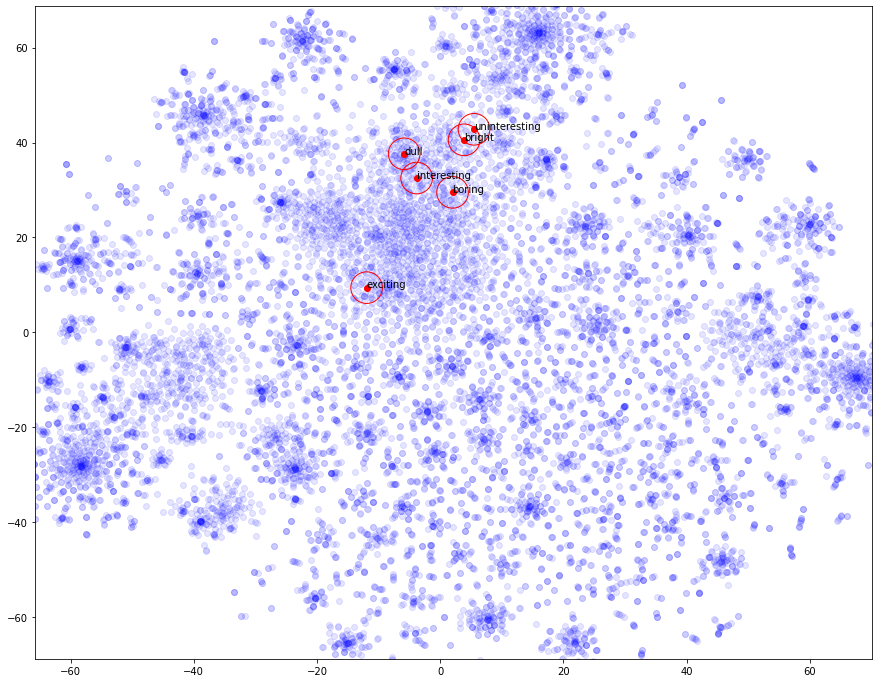


Annotating words: ['wonderful', 'good', 'bad', 'horrid']

Word: wonderful
Number of occurences: 25
Number of co-occurences: {'wonderful': 0.0, 'good': 0.0, 'bad': 0.0, 'horrid': 0.0}
Similarities: {'wonderful': 0.9999999999999998, 'good': 0.49467709794657894, 'bad': 0.36133679629645155, 'horrid': 0.01436212474053565} 

Word: good
Number of occurences: 292
Number of co-occurences: {'wonderful': 0.0, 'good': 18.0, 'bad': 35.0, 'horrid': 0.0}
Similarities: {'wonderful': 0.49467709794657894, 'good': 1.0000000000000002, 'bad': 0.8131142592031806, 'horrid': 0.08596464953049451} 

Word: bad
Number of occurences: 208
Number of co-occurences: {'wonderful': 0.0, 'good': 35.0, 'bad': 76.0, 'horrid': 0.0}
Similarities: {'wonderful': 0.36133679629645155, 'good': 0.8131142592031806, 'bad': 1.0, 'horrid': 0.08890108466158658} 

Word: horrid
Number of occurences: 2
Number of co-occurences: {'wonderful': 0.0, 'good': 0.0, 'bad': 0.0, 'horrid': 0.0}
Similarities: {'wonderful': 0.01436212474053565, 'goo

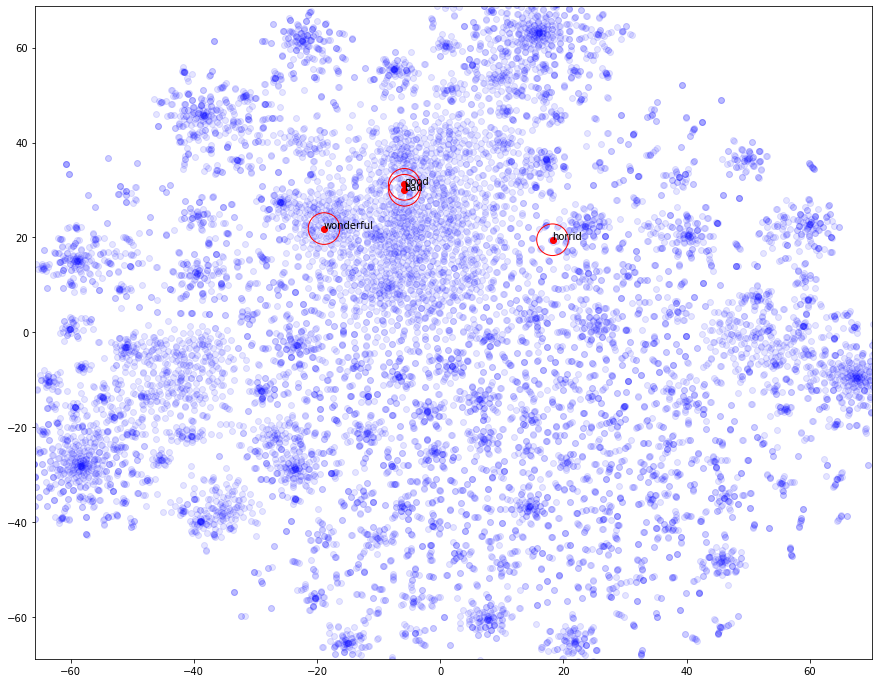

In [ ]:
### YOUR CODE HERE ###
show_embeddings(reduced_tSNE_syn_ant, syn_ant_list, word_to_idx, co_occurrence_matrix, similarity_matrix)

Let's try now with a co-occurence matrix created with a bigger context window

In [ ]:
### YOUR CODE HERE ###
if 'cmat_bigw' not in globals():
    cmat_bigw = co_occurrence_count(df, idx_to_word, word_to_idx, 7)

smat_bigw = cosine_similarity(cmat_bigw,
                              cmat_bigw,
                              transpose_q=True)

reduced_tSNE_syn_ant_bigw = reduce_tSNE(smat_bigw)

Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!


Start plotting embeddings


Annotating words: ['movie', 'film']

Word: movie
Number of occurences: 1089
Number of co-occurences: {'movie': 384.0, 'film': 109.0}
Similarities: {'movie': 1.0, 'film': 0.8241717992054453} 

Word: film
Number of occurences: 908
Number of co-occurences: {'movie': 109.0, 'film': 226.0}
Similarities: {'movie': 0.8241717992054453, 'film': 1.0} 



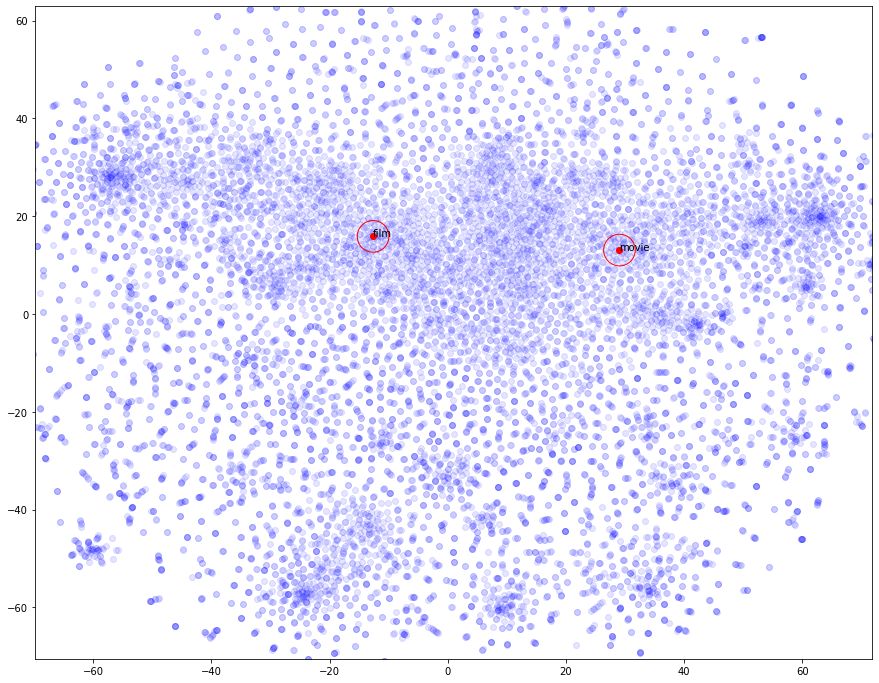


Annotating words: ['woman', 'girl']

Word: woman
Number of occurences: 78
Number of co-occurences: {'woman': 8.0, 'girl': 3.0}
Similarities: {'woman': 1.0, 'girl': 0.5339458659736838} 

Word: girl
Number of occurences: 95
Number of co-occurences: {'woman': 3.0, 'girl': 8.0}
Similarities: {'woman': 0.5339458659736838, 'girl': 0.9999999999999999} 



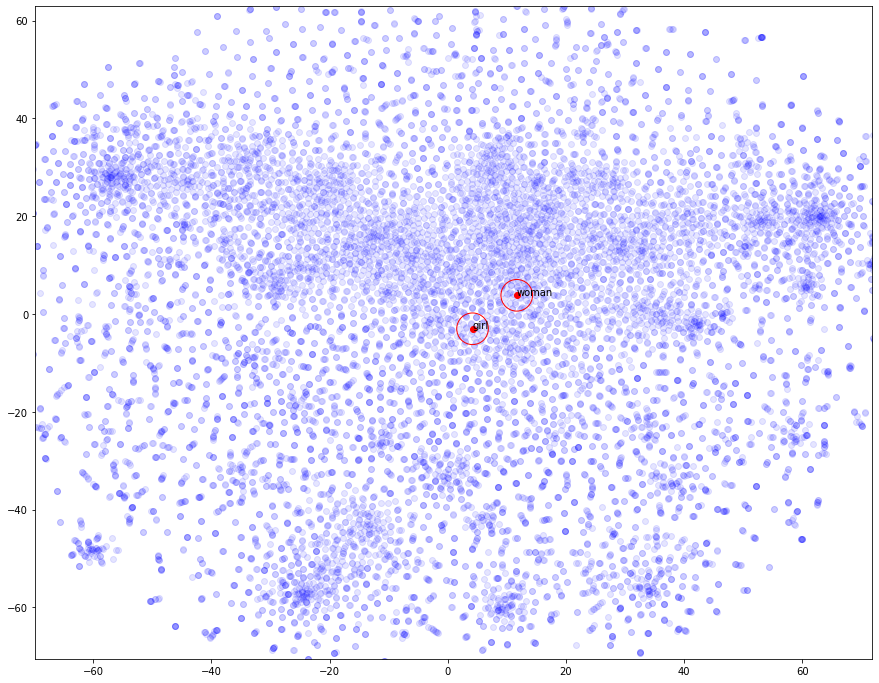


Annotating words: ['boring', 'dull', 'uninteresting', 'bright', 'exciting', 'interesting']

Word: boring
Number of occurences: 38
Number of co-occurences: {'boring': 0.0, 'dull': 3.0, 'uninteresting': 0.0, 'bright': 0.0, 'exciting': 0.0, 'interesting': 1.0}
Similarities: {'boring': 0.9999999999999999, 'dull': 0.4088476445992163, 'uninteresting': 0.1939113870206187, 'bright': 0.15121459472728346, 'exciting': 0.1776476925935179, 'interesting': 0.476991663887951} 

Word: dull
Number of occurences: 17
Number of co-occurences: {'boring': 3.0, 'dull': 0.0, 'uninteresting': 0.0, 'bright': 1.0, 'exciting': 0.0, 'interesting': 1.0}
Similarities: {'boring': 0.4088476445992163, 'dull': 1.0000000000000002, 'uninteresting': 0.14750299379248544, 'bright': 0.15020876836825314, 'exciting': 0.1586646435244518, 'interesting': 0.4830364593904636} 

Word: uninteresting
Number of occurences: 3
Number of co-occurences: {'boring': 0.0, 'dull': 0.0, 'uninteresting': 0.0, 'bright': 0.0, 'exciting': 0.0, 'inte

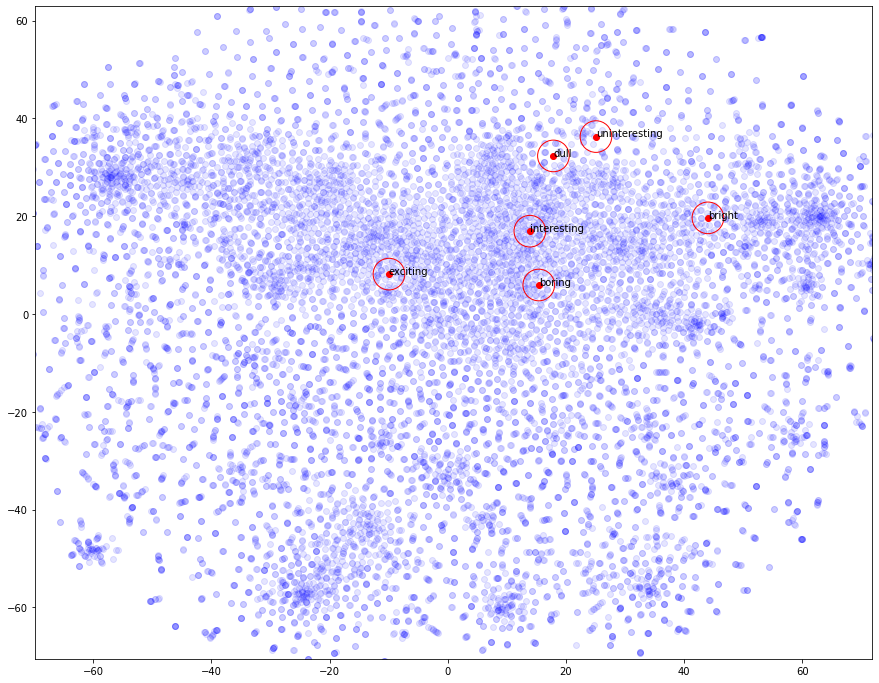


Annotating words: ['wonderful', 'good', 'bad', 'horrid']

Word: wonderful
Number of occurences: 25
Number of co-occurences: {'wonderful': 0.0, 'good': 1.0, 'bad': 0.0, 'horrid': 0.0}
Similarities: {'wonderful': 1.0, 'good': 0.543210680047786, 'bad': 0.4127540469547528, 'horrid': 0.05007158199799797} 

Word: good
Number of occurences: 292
Number of co-occurences: {'wonderful': 1.0, 'good': 40.0, 'bad': 51.0, 'horrid': 0.0}
Similarities: {'wonderful': 0.543210680047786, 'good': 0.9999999999999998, 'bad': 0.8359276125083555, 'horrid': 0.13710671336592686} 

Word: bad
Number of occurences: 208
Number of co-occurences: {'wonderful': 0.0, 'good': 51.0, 'bad': 116.0, 'horrid': 0.0}
Similarities: {'wonderful': 0.4127540469547528, 'good': 0.8359276125083555, 'bad': 0.9999999999999998, 'horrid': 0.12170916713870589} 

Word: horrid
Number of occurences: 2
Number of co-occurences: {'wonderful': 0.0, 'good': 0.0, 'bad': 0.0, 'horrid': 0.0}
Similarities: {'wonderful': 0.05007158199799797, 'good': 0

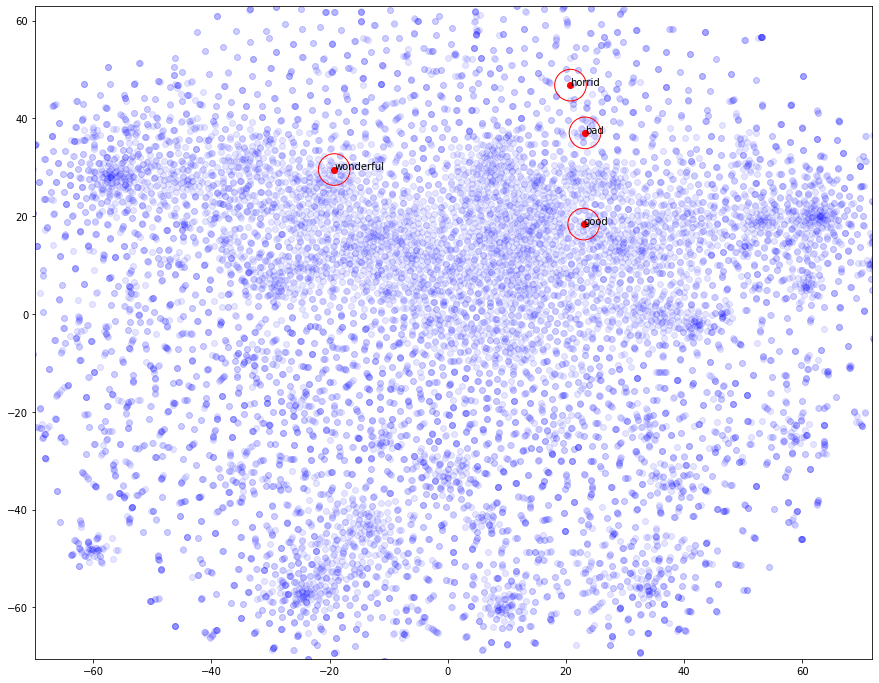

In [ ]:
### YOUR CODE HERE ###
show_embeddings(reduced_tSNE_syn_ant_bigw, syn_ant_list, word_to_idx, cmat_bigw, smat_bigw)

In the following code section it's going to be explored the neighbourhood of some words

In [ ]:
### YOUR CODE HERE ###
from operator import itemgetter

def topk_indices(x, k):
    idx = np.argpartition(x, -k)[-k:]  # Indices not sorted
    return idx[np.argsort(-x[idx])][1:]  # Indices sorted by value from largest to smallest

def k_closest_words(word, reduced_tSNE, word_to_idx, idx_to_word, K):
    word_coordinates = reduced_tSNE[word_to_idx[word],:]
    distance_matrix = np.sqrt(((reduced_tSNE - word_coordinates)**2).sum(axis=1))
    return list(itemgetter(*topk_indices(1-distance_matrix, K))(idx_to_word))

def print_closest_words(word_list, reduced_tSNE, word_to_idx, idx_to_word, cmat, smat, K, plot=True):
    for word in word_list:
        cw = k_closest_words(word, reduced_tSNE, word_to_idx, idx_to_word, K)
        print('Closest words to {}: {}\n'.format(word, cw))
        if plot:
            show_embeddings(reduced_tSNE, [[word]+cw], word_to_idx, cmat, smat, verbose=False)

syn_ant_words = ['beautiful', 'bad', 'actor']

In [ ]:
### YOUR CODE HERE  ###
print_closest_words(syn_ant_words, reduced_tSNE_syn_ant, word_to_idx, idx_to_word, co_occurrence_matrix, similarity_matrix, 10, plot=False)

Closest words to beautiful: ['monkey', 'considered', 'gotten', 'mad', 'plant', 'appear', 'reading', 'decided', 'director']

Closest words to bad: ['cinematography', 'acting', 'bored', 'ok', 'photography', 'hitchcock', 'abound', 'solid', 'good']

Closest words to actor: ['soundtrack', 'actress', 'performance', 'wrote', 'jennifer', 'editing', 'power', 'curtis', 'outside']



Let's now try with a co-occurence matrix created with a bigger context window

In [ ]:
### YOUR CODE HERE  ###
print_closest_words(syn_ant_words, reduced_tSNE_syn_ant_bigw, word_to_idx, idx_to_word, cmat_bigw, smat_bigw, 10, plot=False)

Closest words to beautiful: ['masterpiece', 'authentic', 'unlike', 'pain', 'enough', 'bored', 'direct', 'blend', 'given']

Closest words to bad: ['writing', 'caste', 'nevertheless', 'acting', 'tired', 'cinematography', 'fked', 'embarrassingly', 'direction']

Closest words to actor: ['name', 'presence', 'actress', 'lazy', 'golden', 'pity', 'convincing', 'play', 'grandfather']



** **HOW DO YOU EXPLAIN THE RESULTS OBTAINED IN YOUR EXPERIMENTS? DISCUSS HERE** **<br><br>
It has been invesigated a number of groups of synonims and antonyms.<br>
Observations on these groups have shown that is some cases synonyms and antonyms tends to group together without differentiating whether they are synonims or antonyms.<br>
Since it has been previously said that a co-occurence matrix with a bigger context window is able to capture more semantic features it has also been created a similarity matrix computed by a co-occurence matrix built using a bigger context window.<br>
It can be observed that there are indeed some differences: in some cases it can be seen that synonims/antonyms gets closer to each other (like in the example with: "boring", "dull", "monotonous", "uninteresting", "bright", "exciting", "interesting") but in some other cases it can be seen that words that were previously grouped together got farther from each other (like in the example with: "good", "bad", "wonderful", "horrid").<br>
Furthermore, it has also been investigated whether there would be an actual relationship between the distance of the words and the presence of a synonim/antonym kind of relationship.<br>
The analysis of the neighbourhood shows that some words indeed have some correlation with their neighbours, between the example found we can see that "bad" is close to "good", "actor" is really close to "actress", while the word "beautiful" doesn't have any correlation with its closest neighbours.<br>
Not many different considerations can be done about the co-occurence matrix created with a bigger context window: the results are similar.

#### **[Let's play!] Analogies**

Another useful property to check is analogy resolution via word vectors. In particular, we might want to check if analogies such "man : king == woman : x" bring results like "x = queen".

In order to do so, we first need to define a ranking function that returns the top $K$ most similar words of a given word vector. We might not want to be too much restrctive and play with $K \ge 1$.

In [ ]:
def get_top_K_indexes(data, K):
    """
    Returns the top K indexes of a 1-dimensional array (descending order)
    Example:
        data = [0, 7, 2, 1]
        best_indexes:
        K = 1 -> [1] (data[1] = 7)
        K = 2 -> [1, 2]
        K = 3 -> [1, 2, 3]
        K = 4 -> [1, 2, 3, 4]

    :param data: 1-d dimensional array
    :param K: number of highest value elements to consider

    :return
        - array of indexes corresponding to elements of highest value
    """
    best_indexes = np.argsort(data, axis=0)[::-1]
    best_indexes = best_indexes[:K]

    return best_indexes

def get_top_K_word_ranking(embedding_matrix, idx_to_word, word_to_idx,
                           positive_listing, negative_listing, K):
    """
    Finds the top K most similar words following this reasoning:
        1. words that have highest similarity to words in positive_listing
        2. words that have highest distance to words in negative_listing
    
    Positive and negative listing can be defined accordingly to a given analogy
    Example:
        
        man : king :: woman : x
    
    positive_listing = ['king', 'woman']
    negative_listing = ['man']

    This is equivalent to: compute king - man + woman, and then find the
    most similar candidate.
    
    :param embedding_matrix: embedding matrix of shape (words, embedding dimension).
    Note that in the case of a co-occurrence matrix, the shape is (words, words).
    :param idx_to_word: vocabulary map (index -> word) (dict)
    :param word_to_idx: vocabulary map (word -> index) (dict)
    :param positive_listing: list of words that should have high similarity with
                             top K retrieved ones.
    :param negative_listing: list of words that should have high distance to
                             top K retrieved ones.
    :param K: number of best word matches to consider

    :return
        - top K word matches according to aforementioned criterium
        - similarity values of top K word matches according to aforementioned
          criterium
    """


    # Positive words (similarity)
    positive_indexes = np.array([word_to_idx[word] for word in positive_listing])
    word_positive_vector = np.sum(embedding_matrix[positive_indexes, :], axis=0)

    # Negative words (distance)
    negative_indexes = np.array([word_to_idx[word] for word in negative_listing])
    word_negative_vector = np.sum(embedding_matrix[negative_indexes, :], axis=0)

    # Find candidate words
    target_vector = (word_positive_vector - word_negative_vector) / (len(positive_listing) + len(negative_listing))
    total_indexes = np.concatenate((positive_indexes, negative_indexes))
    valid_indexes = np.setdiff1d(np.arange(embedding_matrix.shape[0]), total_indexes)
    candidate_vectors = embedding_matrix[valid_indexes]


    if hasattr(scipy.sparse, type(candidate_vectors).__name__):
        target_vector = type(candidate_vectors)(target_vector)

    candidate_similarities = cosine_similarity(candidate_vectors, target_vector, transpose_q=True)
    candidate_similarities = candidate_similarities.ravel()

    relative_indexes = get_top_K_indexes(candidate_similarities, K)
    top_K_indexes = valid_indexes[relative_indexes]
    top_K_words = [idx_to_word[idx] for idx in top_K_indexes]

    return top_K_words, candidate_similarities[relative_indexes]


Now do it yourself! Find some examples of analogies that hold and other that do not. Remember to give a proper explanation concerning obtained results.

**Note**: 1-2 examples are sufficient. This exercies is just another way to inspect word embeddings.

In [ ]:
### YOUR CODE HERE ###
def print_topk_analogies(cmat, idx_to_word, word_to_idx, pos_neg_listings, K):
    for pos, neg in pos_neg_listings:
        print('{} : {} :: {} : x'.format(neg[0],pos[0],pos[1]))
        top_K_words, top_K_values = get_top_K_word_ranking(cmat,
                                                           idx_to_word,
                                                           word_to_idx,
                                                           pos,
                                                           neg,
                                                           K)
        print('Top K words: ', top_K_words)
        print('Top K values: ', top_K_values,'\n')
        

K = 10

# Example analogy: tv : episodes :: film : x
# positive listing -> [episodes, film]
# negative listing ->  [tv]
# masterpiece : superb :: x : tragic
pos_neg_listings = [
        [ ['good', 'scene'],['tragic'] ], # tragic : good :: scene : x
        [ ['episode', 'film'], ['tv'] ], # tv : episode :: film : x
        [ ['masterpiece','tragic'], ['superb'] ], # masterpiece : superb :: x : tragic
        [ ['king', 'woman'],['man'] ], # man : king :: woman : x
        [ ['girl','man'],['boy'] ], # boy : girl :: man : x

        [ ['actor', 'woman'],['man'] ], # man : actor :: woman : x
        [ ['actor', 'girl'],['man'] ], # man : actor :: girl : x
        [ ['actress', 'man'],['woman'] ], # woman : actress :: man : x
        [ ['actress', 'man'],['girl'] ], # girl : actress :: man : x

        [ ['girl', 'man'], ['woman'] ], # woman : girl :: man : x
        [ ['boy', 'woman'], ['man'] ], # man : boy :: woman : x
        [ ['girl', 'man'], ['boy'] ], # boy : girl :: man : x
        [ ['boy', 'woman'], ['girl'] ], # girl : boy :: woman : x
]

In [ ]:
### YOUR CODE HERE ###
print('='*40,'\nAnalogies with co-occurence matrix','\n'+'='*40,'\n')
print_topk_analogies(co_occurrence_matrix, idx_to_word, word_to_idx, pos_neg_listings, K)

Analogies with co-occurence matrix 

tragic : good :: scene : x
Top K words:  ['one', 'movie', 'really', 'like', 'great', 'make', 'made', 'well', 'even', 'time']
Top K values:  [0.84723958 0.81977752 0.81612237 0.8066272  0.79626719 0.78930727
 0.78816082 0.78218445 0.78121031 0.77784447] 

tv : episode :: film : x
Top K words:  ['movie', 'one', 'thing', 'even', 'really', 'story', 'would', 'way', 'character', 'time']
Top K values:  [0.79984205 0.76337895 0.73148435 0.73146664 0.71553224 0.71276331
 0.7118919  0.70202594 0.69930918 0.6977256 ] 

superb : masterpiece :: tragic : x
Top K words:  ['trophy', 'slipped', 'external', '13th', 'dubious', 'patriot', 'fascist', 'trotted', 'guignol', 'griffith']
Top K values:  [0.16216874 0.15075567 0.14414999 0.14414999 0.14414999 0.14245072
 0.14101902 0.14101902 0.14101902 0.1391003 ] 

man : king :: woman : x
Top K words:  ['platinum', 'tunnelvision', 'demonstrated', 'reiterated', 'bewlidered', 'newly', 'applied', 'revolutionized', 'attached', 

Let's now try with a co-occurence matrix created with a bigger context window

In [ ]:
### YOUR CODE HERE ###
if 'cmat_bigw' not in globals():
    cmat_bigw = co_occurrence_count(df, idx_to_word, word_to_idx, 7)

print('\n'+'='*40,'\nAnalogies with co-occurence matrix created with bigger window size','\n'+'='*40,'\n')
print_topk_analogies(cmat_bigw, idx_to_word, word_to_idx, pos_neg_listings, K)


Analogies with co-occurence matrix created with bigger window size 

tragic : good :: scene : x
Top K words:  ['movie', 'one', 'really', 'like', 'well', 'time', 'film', 'made', 'make', 'even']
Top K values:  [0.89774627 0.88807539 0.88352545 0.87162967 0.85945356 0.85671313
 0.84617293 0.8437779  0.84357222 0.84104762] 

tv : episode :: film : x
Top K words:  ['one', 'like', 'even', 'character', 'story', 'make', 'great', 'really', 'well', 'first']
Top K values:  [0.85951676 0.82323893 0.82141975 0.81456771 0.81312104 0.81138412
 0.81114101 0.80657456 0.80574823 0.8050204 ] 

superb : masterpiece :: tragic : x
Top K words:  ['rickman', 'stripped', 'warp', 'aice', 'prevents', 'nighteyes', 'guignol', 'israel', 'weirdest', 'chaevsky']
Top K values:  [0.15386436 0.15231795 0.15120368 0.14596855 0.13957263 0.13957263
 0.13957263 0.1381927  0.13121597 0.12794158] 

man : king :: woman : x
Top K words:  ['louder', 'stereo', 'apollonia', 'hindu', 'sita', 'mistreated', 'pleasuring', 'priesthood

** **HOW DO YOU EXPLAIN THE RESULTS OBTAINED IN YOUR EXPERIMENTS? DISCUSS HERE** **<br>
The results obtained contains very little positive outcomes.<br>
Only the query "girl : actress :: man : x" and "woman : actress :: man : x" seem to relay acceptable results.<br>
The reason behind this result may be because some words are not specifically related to the topic of the dataset making it difficult to discern their semantic role (like for the query "man : king :: woman : x", unless there's a review that speaks about a movie in which king and queens appear).<br>
In general the cause for the poor result might actually be related to the lack of semantic data which would put in relation those words that might bring to a good analogy, this would also explain the poor results with the in-domain words used (like for the query "man : actor :: woman : x").<br>
Another cause for some negative results might also be given from the variability of words: for instance the query "boy : girl :: man : x" does not have positive outcome, while the query "girl : boy :: woman : x" is instead succesful in returning "men". With ulterior preprocessing it should be possible to mitigate the problem.<br>
Using a co-occurence matrix created with a bigger context window bring only little improvements.<br>
Using the entire dataset instead of just a slice might be able to bring about positive results.

#### **[Let's play!] Bias**

When we talk about societies we are usually aware of their related biases (gender, race, sexual orientation, etc..). Indeed, this fact is reflected at textual level. For example, when we consider the word 'doctor' we usually think of a 'man', whereas when we consider the word 'nurse' we usually think of a 'woman'.

Let's see if word embeddings reflect such harmful biases. Find an example of bias by following the analogy approach.

In [ ]:
### YOUR CODE HERE ###
def print_bias_list(cmat, word_to_idx, pos, neg, word_list_biases):
    gender_bias = cmat[word_to_idx[pos]] - cmat[word_to_idx[neg]]

    for word in word_list_biases:
        word_vector = cmat[word_to_idx[word]]
        print('{0:15}{1}'.format(word+':', cosine_similarity(word_vector,gender_bias,transpose_q=True).item()))


# Positive values are more biased toward woman while negative values more toward man
bias_pos = 'woman'
bias_neg = 'man'

word_list_biases = ['doctor','secretary','person','actor','beauty','student','friend','king','queen','majesty','girl','actress','makeup']

In [ ]:
### YOUR CODE HERE ###
print('='*40,'\nGender biases for Co-occurence matrix','\n'+'='*40,'\n')
print_bias_list(co_occurrence_matrix, word_to_idx, bias_pos, bias_neg, word_list_biases)

Gender biases for Co-occurence matrix 

doctor:        -0.038818249027793815
secretary:     -0.05537014788694124
person:        -0.028079732944315722
actor:         -0.22033260292880733
beauty:        -0.06547353101665866
student:       -0.1013169963038194
friend:        -0.169931922999118
king:          -0.09453162826041556
queen:         -0.07009441065793735
majesty:       0.0
girl:          -0.22608015795814274
actress:       -0.14755624370738457
makeup:        0.007220828335732076


Let's now try with a co-occurence matrix created with a bigger context window

In [ ]:
### YOUR CODE HERE ###
if 'cmat_bigw' not in globals():
    cmat_bigw = co_occurrence_count(df, idx_to_word, word_to_idx, 7)

print('='*40,'\nGender biases for Co-occurence matrix created with bigger context window\'s size','\n'+'='*40,'\n')
print_bias_list(cmat_bigw, word_to_idx, bias_pos, bias_neg, word_list_biases)

Gender biases for Co-occurence matrix created with bigger context window's size 

doctor:        -0.0846989741745864
secretary:     -0.08208376818713668
person:        -0.13045338202674475
actor:         -0.3379651460503338
beauty:        -0.15915203346495113
student:       -0.13530853625482694
friend:        -0.21977072871783632
king:          -0.12113878839086618
queen:         -0.10573811848477242
majesty:       -0.08775939545964605
girl:          -0.3155495672945203
actress:       -0.21207190678175716
makeup:        -0.016820226335319


** **HOW DO YOU EXPLAIN THE RESULTS OBTAINED IN YOUR EXPERIMENTS? DISCUSS HERE** **<br>
It can be seen that the gender bias captured for the words used suggest that the datased is more biased towards "man" rather than "woman".<br>
There might actually be some considerations to be done about these results: while it may be understandable for gender neutral words to be more biased toward man rather than woman, the feminine gender words used (such as queen, girl, actress) and words tipically referable to the domain of women interests (like makeup) should have had at least a light bias toward woman (which was actually the case for the basic co-occurence matrix but it was very neutral and then erased with the co-occurence matrix with bigger context window).<br>
The probable reason for this behaviour should yet again be a lack of semantically relevant data that would connect "woman" with the feminine-related words.

## Better sparse word embeddings

Until now we've played with the most basic type of word encoding, that is count-based co-occurrence matrix. However, there are better ways to encode words.

In particular, we will explore positive pointwise mutual information (PPMI) weighting technique.

### PPMI

Pointwise mutual information (PMI) is a weighting technique, just like tf-dif, that gives more weight to word pairs based on how often they occur within the same context window that we would have expected them to appear by chance.

$PMI(w1, w2) = \log_2 \frac{P(w1, w2)}{P(w1)P(w2)}$

PMI value range is $[-\infty, \infty]$, but negative values are a bit tricky, unless we have a very big corpus. Thus, it is more common to replace all negative PMI values with zero.

$PPMI(w1, w2) = \max(\log_2 \frac{P(w1, w2)}{P(w1)P(w2)}, 0)$

Now, it's your turn to weight the count-based co-occurrence matrix with PPMI technique.

**PPMI Memo**: 
Given a co-occurrence matrix C of shape (N, M), we can turn it into a PPMI matrix as follows:

$p_{i,j} = \frac{C_{i, j}}{\sum_{i=1}^N \sum_{j=1}^M C_{i,j}}$

$p_{i,*} = \frac{\sum_{j=1}^M C_{i, j}}{\sum_{i=1}^N \sum_{j=1}^M C_{i,j}}$

$p_{*,j} = \frac{\sum_{i=1}^N C_{i, j}}{\sum_{i=1}^N \sum_{j=1}^M C_{i,j}}$

$PPMI_{i, j} = \max(\log_2 \frac{p_{i, j}}{p_{i, *} \, p_{*, j}}, 0)$

In [ ]:
# Function definition

def convert_ppmi(co_occurrence_matrix):
    """
    Converts a count-based co-occurrence matrix to a PPMI matrix

    :param co_occurrence_matrix: count based co-occurrence matrix of shape (|V|, |V|)
    
    :return
        - PPMI co-occurrence matrix of shape (|V|, |V|)
    """

    ### YOUR CODE HERE ###
    sparse_matrix = hasattr(scipy.sparse, type(co_occurrence_matrix).__name__)

    csum = co_occurrence_matrix.sum()

    pij = co_occurrence_matrix             / csum
    pi  = co_occurrence_matrix.sum(axis=1) / csum
    pj  = co_occurrence_matrix.sum(axis=0) / csum
    with np.errstate(divide='ignore'):
        PPMI = np.maximum( np.log2(pij/np.outer(pi,pj)), 0)
    if sparse_matrix:
        PPMI = type(co_occurrence_matrix)(PPMI)
    return PPMI

# Testing

print("Computing PPMI co-occurrence matrix...")
ppmi_occurrence_matrix = convert_ppmi(co_occurrence_matrix)
print("PPMI completed!")

# Evaluation

def evaluate_ppmi_matrix(matrix):
    is_sparse = False

    if hasattr(scipy.sparse, type(matrix).__name__):
        print("Detected sparse PPMI co-occurrence matrix!")
        is_sparse = True

    # Check symmetry
    print("[Co-occurrence PPMI matrix Evaluation] Symmetry checking...")
    if is_sparse:
        try:
            assert (matrix != matrix.transpose()).nnz == 0
        except AssertionError:
            assert sparse_allclose(matrix, matrix.transpose())
    else:
        try:
            assert np.equal(matrix, matrix.transpose()).all()
        except AssertionError:
            assert np.allclose(matrix, matrix.transpose())

    # A very simple example
    print("[Co-occurrence PPMI matrix Evaluation] Toy example checking...")

    toy_df = pd.DataFrame.from_dict({
        'sentence_1': ["All that glitters is not gold"],
        'sentence_2': ["All in all I like this assignment"]
    })

    # We should already have download co-occurrence benchmark data
    benchmark_path = os.path.join(os.getcwd(), 'Benchmark')
    toy_path = os.path.join(benchmark_path, 'co-occurrence_count_benchmark')
    toy_idx_to_word = np.load(os.path.join(toy_path, 'toy_idx_to_word.npy'), allow_pickle=True).item()
    toy_word_to_idx = np.load(os.path.join(toy_path, 'toy_word_to_idx.npy'), allow_pickle=True).item()
    toy_valid_matrix = np.load(os.path.join(toy_path, 'toy_co_occurrence_matrix_count.npy'))

    toy_ppmi_matrix = convert_ppmi(toy_valid_matrix)
    toy_valid_ppmi_matrix = np.load(os.path.join(toy_path, 'toy_co_occurrence_matrix_ppmi.npy'))

    if is_sparse:
        try:
            assert type(matrix)(toy_ppmi_matrix != toy_valid_ppmi_matrix).nnz == 0
        except AssertionError:
            assert sparse_allclose(toy_ppmi_matrix, toy_valid_ppmi_matrix)
    else:
        try:
            assert np.equal(toy_ppmi_matrix, toy_valid_ppmi_matrix).all()
        except AssertionError:
            assert np.allclose(toy_ppmi_matrix, toy_valid_ppmi_matrix)


print('Evaluating PPMi matrix conversion...')
evaluate_ppmi_matrix(ppmi_occurrence_matrix)
print('Evaluation completed!')

Computing PPMI co-occurrence matrix...
PPMI completed!
Evaluating PPMi matrix conversion...
Detected sparse PPMI co-occurrence matrix!
[Co-occurrence PPMI matrix Evaluation] Symmetry checking...
[Co-occurrence PPMI matrix Evaluation] Toy example checking...
Evaluation completed!


### **Got Stuck?**

If you are stuck, but still want to try out following sections, you can experiment with a valid PPMI co-occurrence matrix provided by us as follows

In [ ]:
'''
benchmark_path = os.path.join(os.getcwd(), 'Benchmark')
valid_data_benchmark_path = os.path.join(benchmark_path, 'co-occurrence_count_benchmark', "{}.npy")

ppmi_occurrence_matrix = np.load(valid_data_benchmark_path.format('valid_co-occurrence_matrix_ppmi'))

print('PPMI Co-occurrence matrix shape: ', ppmi_occurrence_matrix.shape)
'''

'\nbenchmark_path = os.path.join(os.getcwd(), \'Benchmark\')\nvalid_data_benchmark_path = os.path.join(benchmark_path, \'co-occurrence_count_benchmark\', "{}.npy")\n\nppmi_occurrence_matrix = np.load(valid_data_benchmark_path.format(\'valid_co-occurrence_matrix_ppmi\'))\n\nprint(\'PPMI Co-occurrence matrix shape: \', ppmi_occurrence_matrix.shape)\n'

### Visualization (cont'd)

Let's see if these weighting techniques have brought some change at visualization level!

Pick a dimensionality reduction technique and explore the new embedding space.

Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']


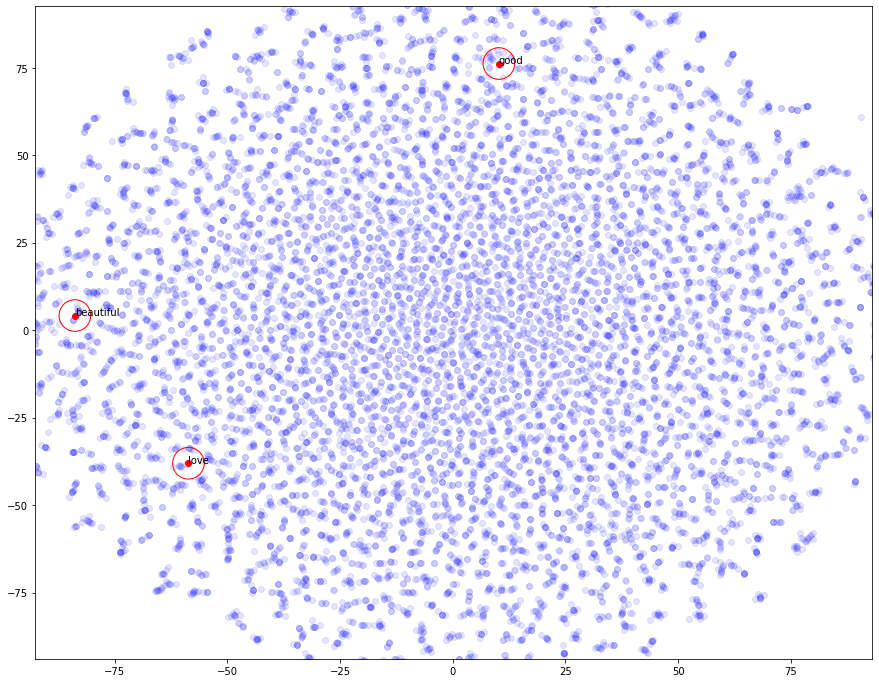

In [ ]:
### YOUR CODE HERE ###
reduced_tSNE_ppmi = reduce_tSNE(ppmi_occurrence_matrix)
visualize_embeddings(reduced_tSNE_ppmi, ['good', 'love', 'beautiful'], word_to_idx)
plt.show()

Feel free to play with visualization!

In [ ]:
### YOUR CODE HERE ###
if 'cmat_smallw' not in globals():
    cmat_smallw = co_occurrence_count(df, idx_to_word, word_to_idx, 1)

if 'cmat_bigw' not in globals():
    cmat_bigw = co_occurrence_count(df, idx_to_word, word_to_idx, 7)


if 'cmat_ppmi_smallw' in globals():
    print('Deallocating cmat_smallw ...')
    del cmat_ppmi_smallw
    gc.collect()
    time.sleep(10.)
    print('Done\n')

if 'cmat_ppmi_bigw' in globals():
    print('Deallocating cmat_bigw ...')
    del cmat_ppmi_bigw
    gc.collect()
    time.sleep(10.)
    print('Done\n')

cmat_ppmi_smallw = convert_ppmi(cmat_smallw)
cmat_ppmi_bigw = convert_ppmi(cmat_bigw)

Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']
Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']


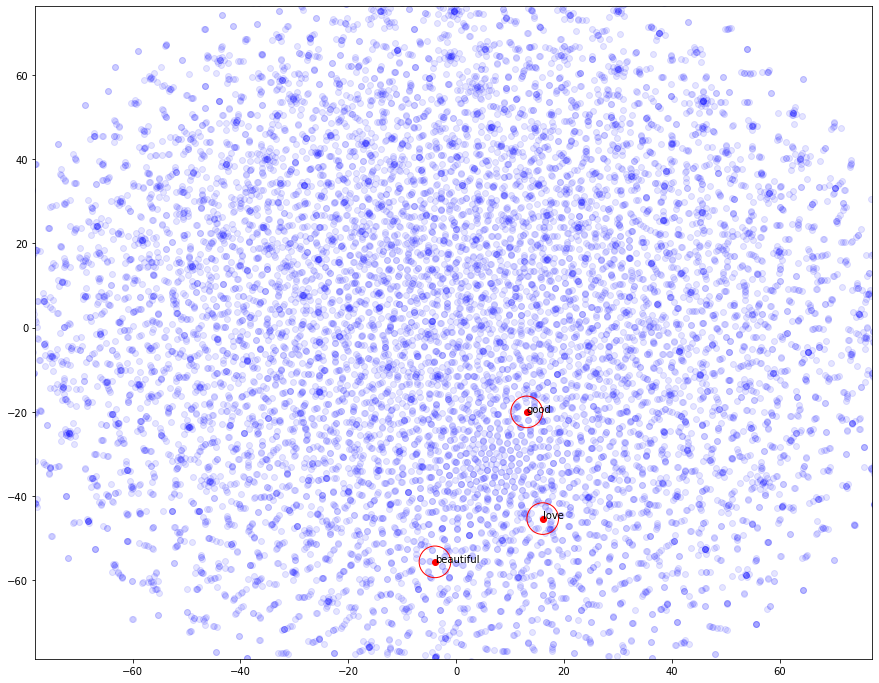

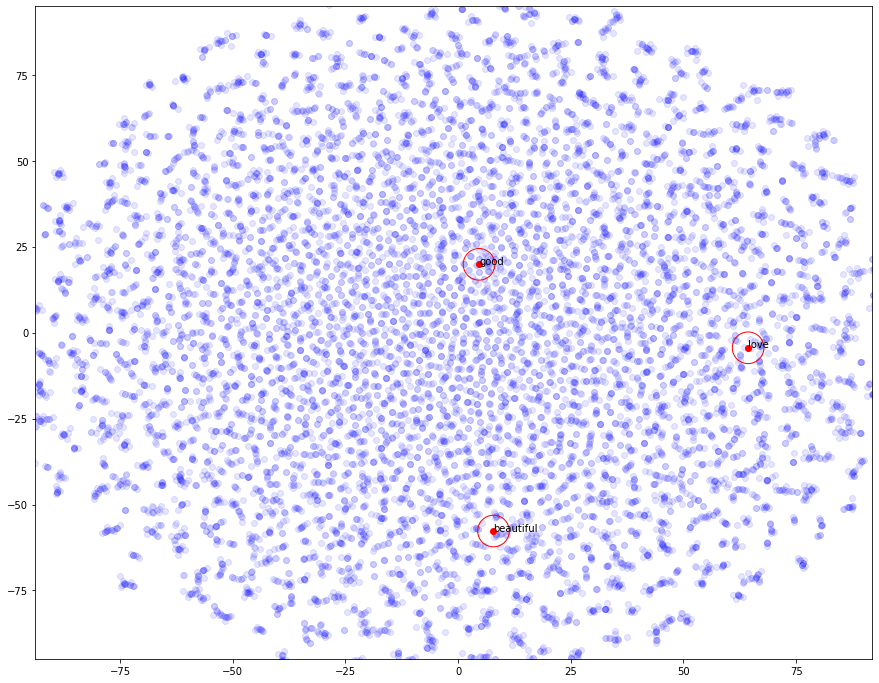

In [ ]:
### YOUR CODE HERE ###
reduced_tSNE_ppmi_smallw = reduce_tSNE(cmat_ppmi_smallw)
visualize_embeddings(reduced_tSNE_ppmi_smallw, ['good', 'love', 'beautiful'], word_to_idx)

reduced_tSNE_ppmi_bigw = reduce_tSNE(cmat_ppmi_bigw)
visualize_embeddings(reduced_tSNE_ppmi_bigw, ['good', 'love', 'beautiful'], word_to_idx)

plt.show()

### [Let's play!] Embedding properties (cont'd)

Choose a word embedding property to analyse (synonyms, analogies, bias) and either select and describe a new example or pick an old one and compare previously achieved results with current ones!

#### **Synonyms / Antonyms**

In [ ]:
### YOUR CODE HERE ###
similarity_matrix_ppmi = cosine_similarity(ppmi_occurrence_matrix, ppmi_occurrence_matrix, transpose_q=True)
reduced_tSNE_ppmi_syn_ant = reduce_tSNE(similarity_matrix_ppmi)

Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!


Start plotting embeddings


Annotating words: ['movie', 'film']

Word: movie
Number of occurences: 1089
Number of co-occurences: {'movie': 0.11468163345971026, 'film': 0.0}
Similarities: {'movie': 0.9999999999999959, 'film': 0.1319397598555974} 

Word: film
Number of occurences: 908
Number of co-occurences: {'movie': 0.0, 'film': 0.0}
Similarities: {'movie': 0.1319397598555974, 'film': 0.9999999999999961} 



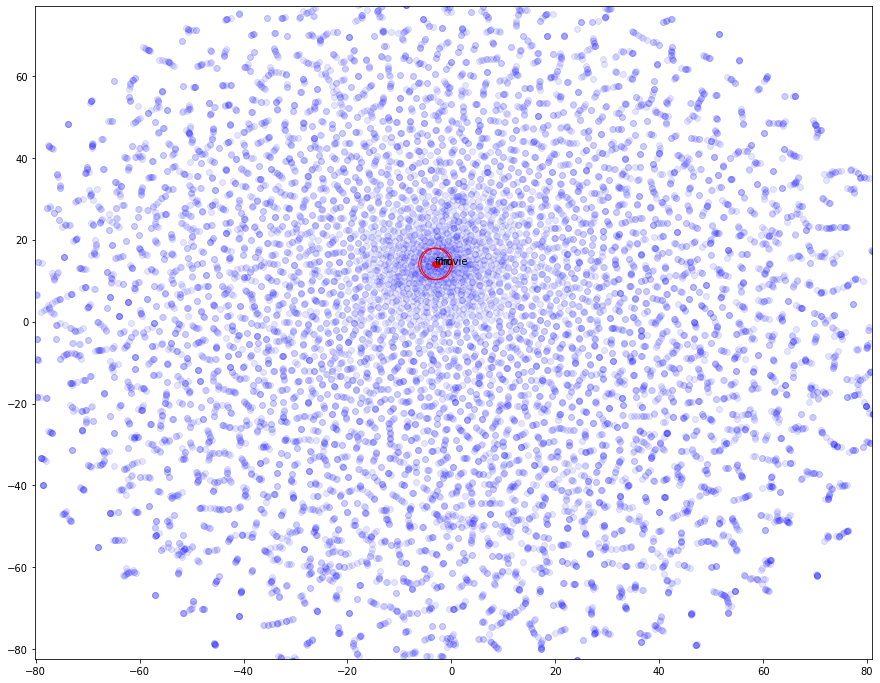


Annotating words: ['woman', 'girl']

Word: woman
Number of occurences: 78
Number of co-occurences: {'woman': 2.3069193310520184, 'girl': 1.0216360630115295}
Similarities: {'woman': 0.9999999999999991, 'girl': 0.06678735382724647} 

Word: girl
Number of occurences: 95
Number of co-occurences: {'woman': 1.0216360630115295, 'girl': 1.7363527949710402}
Similarities: {'woman': 0.06678735382724661, 'girl': 1.0000000000000013} 



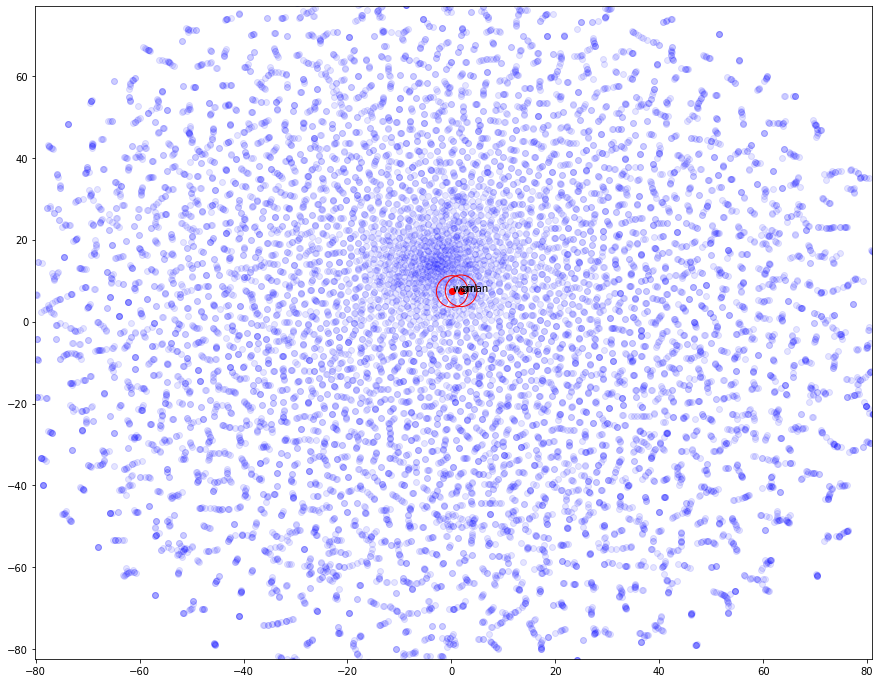


Annotating words: ['boring', 'dull', 'uninteresting', 'bright', 'exciting', 'interesting']

Word: boring
Number of occurences: 38
Number of co-occurences: {'boring': 0.0, 'dull': 5.203384082110943, 'uninteresting': 0.0, 'bright': 0.0, 'exciting': 0.0, 'interesting': 1.3608210616066203}
Similarities: {'boring': 1.0000000000000007, 'dull': 0.09374822982196097, 'uninteresting': 0.026134420007843915, 'bright': 0.01583410984486301, 'exciting': 0.024553953711959033, 'interesting': 0.043169571832622315} 

Word: dull
Number of occurences: 17
Number of co-occurences: {'boring': 5.203384082110943, 'dull': 0.0, 'uninteresting': 0.0, 'bright': 6.228215935090878, 'exciting': 0.0, 'interesting': 2.5002954805276785}
Similarities: {'boring': 0.09374822982196097, 'dull': 1.0000000000000002, 'uninteresting': 0.07523053551673127, 'bright': 0.04505333855812427, 'exciting': 0.014074763638082547, 'interesting': 0.059908887813758395} 

Word: uninteresting
Number of occurences: 3
Number of co-occurences: {'b

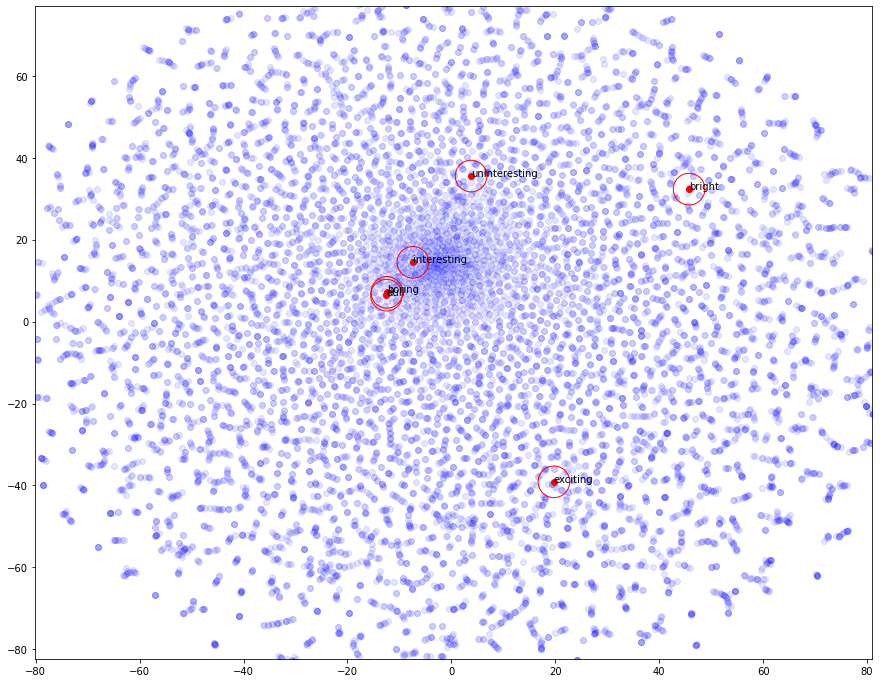


Annotating words: ['wonderful', 'good', 'bad', 'horrid']

Word: wonderful
Number of occurences: 25
Number of co-occurences: {'wonderful': 0.0, 'good': 0.0, 'bad': 0.0, 'horrid': 0.0}
Similarities: {'wonderful': 1.0000000000000004, 'good': 0.03455425895216834, 'bad': 0.02821754319009518, 'horrid': 0.0005048472453384647} 

Word: good
Number of occurences: 292
Number of co-occurences: {'wonderful': 0.0, 'good': 0.7465215811145047, 'bad': 2.2025555649203596, 'horrid': 0.0}
Similarities: {'wonderful': 0.034554258952168286, 'good': 0.9999999999999986, 'bad': 0.12122858166221001, 'horrid': 0.008411495606732843} 

Word: bad
Number of occurences: 208
Number of co-occurences: {'wonderful': 0.0, 'good': 2.2025555649203596, 'bad': 3.81787602972218, 'horrid': 0.0}
Similarities: {'wonderful': 0.028217543190095166, 'good': 0.12122858166221015, 'bad': 0.9999999999999999, 'horrid': 0.014185628374449399} 

Word: horrid
Number of occurences: 2
Number of co-occurences: {'wonderful': 0.0, 'good': 0.0, 'ba

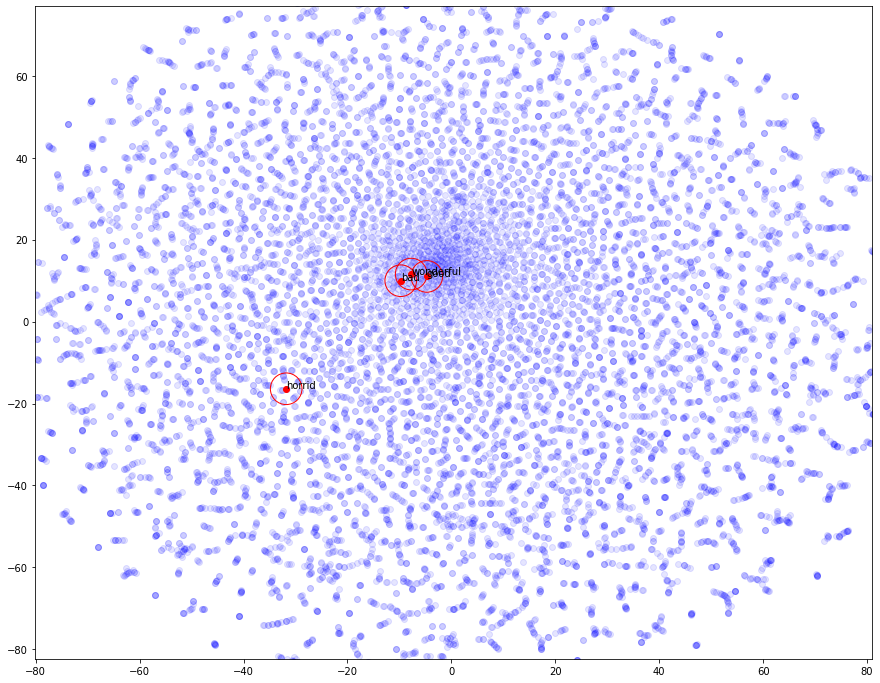

In [ ]:
### YOUR CODE HERE ###
show_embeddings(reduced_tSNE_ppmi_syn_ant, syn_ant_list, word_to_idx, ppmi_occurrence_matrix, similarity_matrix_ppmi)

Let's now try with a co-occurence matrix created with a bigger context window

In [ ]:
### YOUR CODE HERE ###
if 'cmat_ppmi_bigw' not in globals():
    if 'cmat_bigw' not in globals():
        cmat_bigw = co_occurrence_count(df, idx_to_word, word_to_idx, 7)
    cmat_ppmi_bigw = convert_ppmi(cmat_bigw)
    

smat_ppmi_bigw = cosine_similarity(cmat_ppmi_bigw, cmat_ppmi_bigw, transpose_q=True)
reduced_tSNE_ppmi_syn_ant_bigw = reduce_tSNE(smat_ppmi_bigw)

Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!


Start plotting embeddings


Annotating words: ['movie', 'film']

Word: movie
Number of occurences: 1089
Number of co-occurences: {'movie': 0.6513098375137765, 'film': 0.0}
Similarities: {'movie': 0.999999999999995, 'film': 0.150523667213164} 

Word: film
Number of occurences: 908
Number of co-occurences: {'movie': 0.0, 'film': 0.36358467124165217}
Similarities: {'movie': 0.15052366721316363, 'film': 0.9999999999999926} 



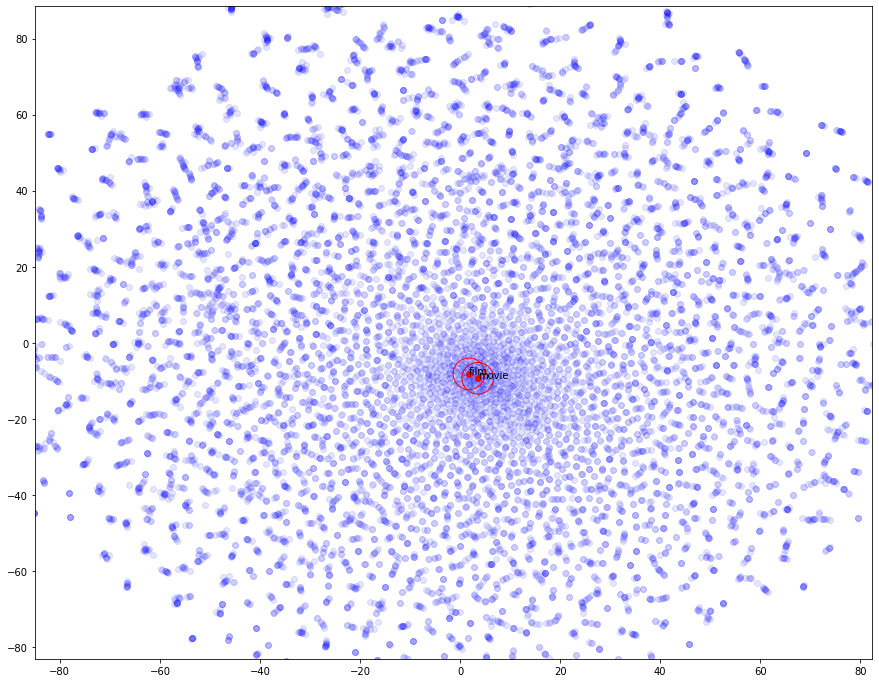


Annotating words: ['woman', 'girl']

Word: woman
Number of occurences: 78
Number of co-occurences: {'woman': 2.4959799705895214, 'girl': 0.793253537411313}
Similarities: {'woman': 1.0000000000000007, 'girl': 0.08647550204920154} 

Word: girl
Number of occurences: 95
Number of co-occurences: {'woman': 0.793253537411313, 'girl': 1.9206021027907922}
Similarities: {'woman': 0.08647550204920144, 'girl': 0.9999999999999998} 



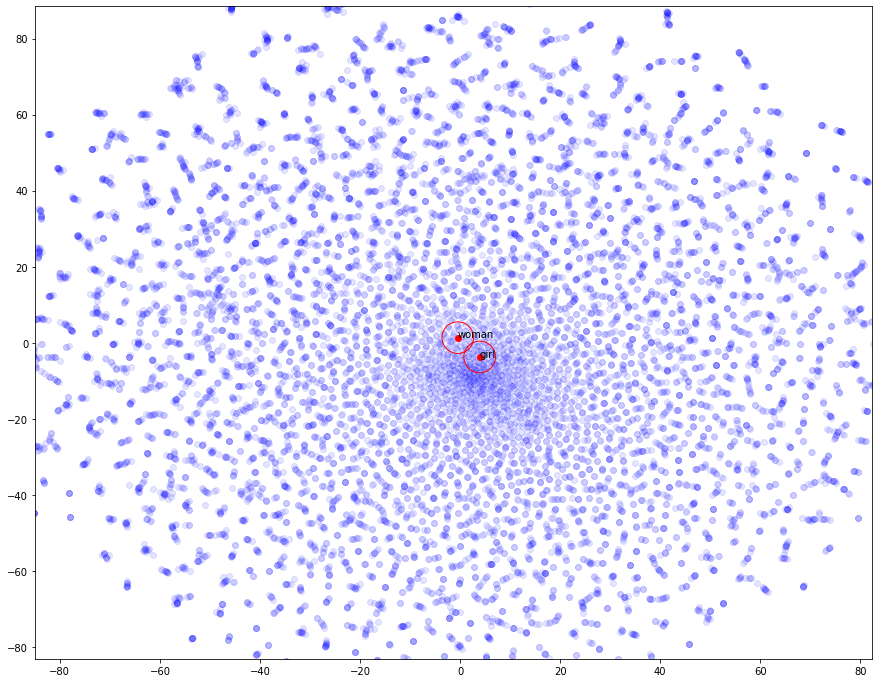


Annotating words: ['boring', 'dull', 'uninteresting', 'bright', 'exciting', 'interesting']

Word: boring
Number of occurences: 38
Number of co-occurences: {'boring': 0.0, 'dull': 4.437589453768301, 'uninteresting': 0.0, 'bright': 0.0, 'exciting': 0.0, 'interesting': 0.5964337183515322}
Similarities: {'boring': 1.0000000000000004, 'dull': 0.10965169261832965, 'uninteresting': 0.034328918061978436, 'bright': 0.042165528257334405, 'exciting': 0.0313830414065312, 'interesting': 0.04987489792148696} 

Word: dull
Number of occurences: 17
Number of co-occurences: {'boring': 4.437589453768301, 'dull': 0.0, 'uninteresting': 0.0, 'bright': 5.426093814930471, 'exciting': 0.0, 'interesting': 1.7230142149166752}
Similarities: {'boring': 0.10965169261832963, 'dull': 1.0000000000000007, 'uninteresting': 0.04817807107780813, 'bright': 0.04126150377269742, 'exciting': 0.034233089430743796, 'interesting': 0.06748993930675914} 

Word: uninteresting
Number of occurences: 3
Number of co-occurences: {'bori

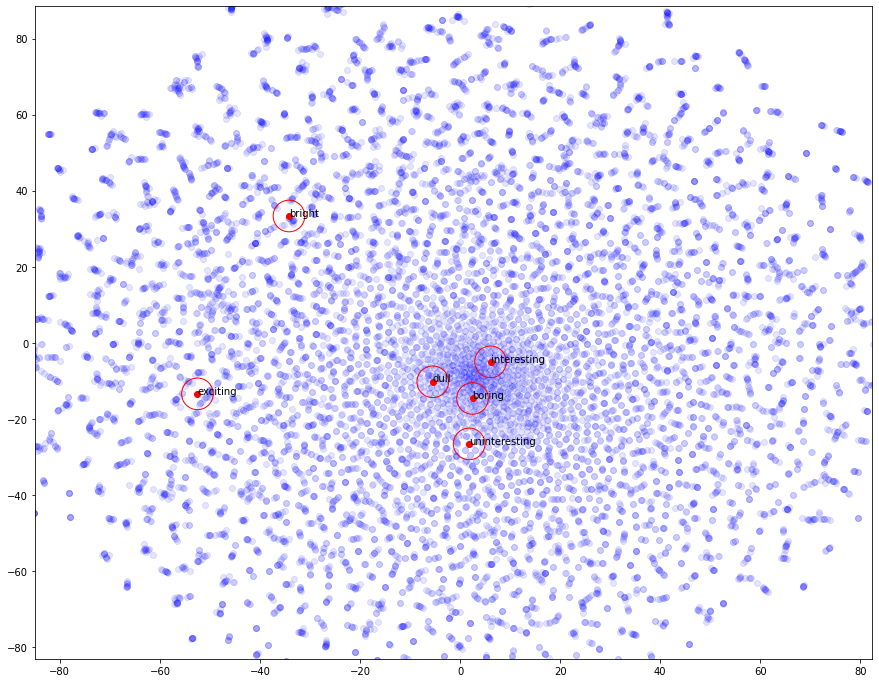


Annotating words: ['wonderful', 'good', 'bad', 'horrid']

Word: wonderful
Number of occurences: 25
Number of co-occurences: {'wonderful': 0.0, 'good': 0.0, 'bad': 0.0, 'horrid': 0.0}
Similarities: {'wonderful': 0.9999999999999997, 'good': 0.04206037347758133, 'bad': 0.036362117070858437, 'horrid': 0.0022007412168955883} 

Word: good
Number of occurences: 292
Number of co-occurences: {'wonderful': 0.0, 'good': 1.1336311368765832, 'bad': 1.9808196211670959, 'horrid': 0.0}
Similarities: {'wonderful': 0.04206037347758117, 'good': 0.9999999999999957, 'bad': 0.17258992348550353, 'horrid': 0.020153440101107162} 

Word: bad
Number of occurences: 208
Number of co-occurences: {'wonderful': 0.0, 'good': 1.9808196211670959, 'bad': 3.6630665115295518, 'horrid': 0.0}
Similarities: {'wonderful': 0.03636211707085851, 'good': 0.17258992348550461, 'bad': 1.0000000000000018, 'horrid': 0.06708577863366087} 

Word: horrid
Number of occurences: 2
Number of co-occurences: {'wonderful': 0.0, 'good': 0.0, 'ba

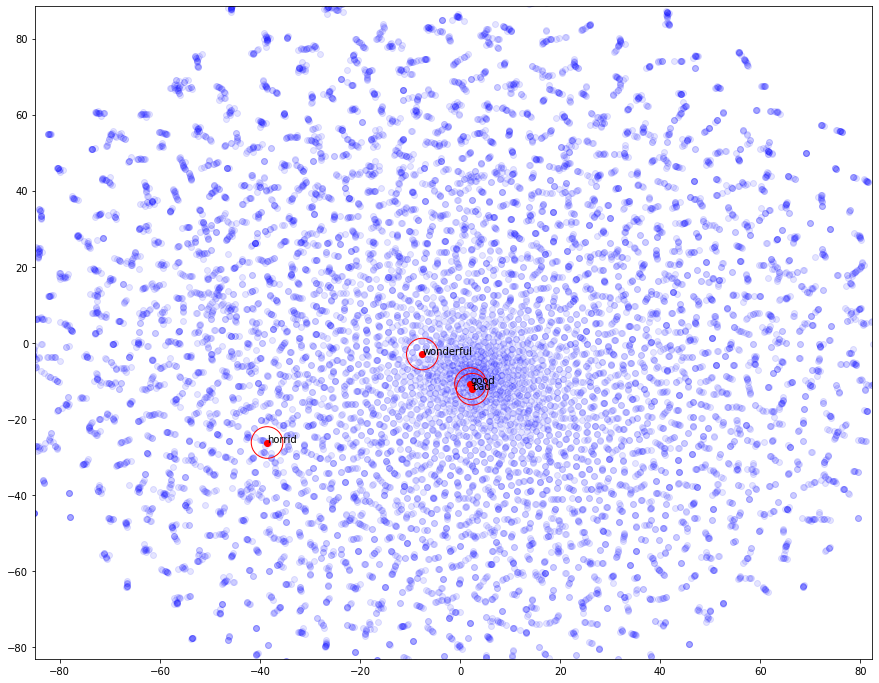

In [ ]:
### YOUR CODE HERE ###
show_embeddings(reduced_tSNE_ppmi_syn_ant_bigw, syn_ant_list, word_to_idx, cmat_ppmi_bigw, smat_ppmi_bigw)

Let's try to look at the nighbourhood of some words

In [ ]:
### YOUR CODE HERE  ###
print_closest_words(syn_ant_words, reduced_tSNE_ppmi_syn_ant, word_to_idx, idx_to_word, ppmi_occurrence_matrix, similarity_matrix_ppmi, 10, plot=False)

Closest words to beautiful: ['looked', 'world', 'song', 'major', 'porpoise', 'minor', 'written', 'educational', 'feature']

Closest words to bad: ['non', 'acting', 'poor', 'horrible', 'solid', 'action', 'directing', 'decent', 'believable']

Closest words to actor: ['fine', 'actress', 'famous', 'name', 'lead', 'average', 'hired', 'performance', 'mark']



In [ ]:
### YOUR CODE HERE  ###
print_closest_words(syn_ant_words, reduced_tSNE_ppmi_syn_ant_bigw, word_to_idx, idx_to_word, cmat_ppmi_bigw, smat_ppmi_bigw, 10, plot=False)

Closest words to beautiful: ['direction', 'photography', 'god', 'realistic', 'complex', 'plain', 'sometimes', 'using', 'editing']

Closest words to bad: ['surprise', 'acting', 'non', 'production', 'action', 'mostly', 'quite', 'mean', 'music']

Closest words to actor: ['lead', 'actress', 'perfectly', 'ok', 'name', 'performance', 'excellent', 'quality', 'job']



#### **Analogies**

In [ ]:
### YOUR CODE HERE  ###
print('='*40,'\nAnalogies with ppmi matrix','\n'+'='*40,'\n')
print_topk_analogies(ppmi_occurrence_matrix, idx_to_word, word_to_idx, pos_neg_listings, K)

Analogies with ppmi matrix 

tragic : good :: scene : x
Top K words:  ['movie', 'one', 'bad', 'film', 'pretty', 'acting', 'action', 'really', 'character', 'plot']
Top K values:  [0.14189107 0.12517699 0.1231882  0.12163462 0.12046681 0.11476174
 0.10863104 0.10832835 0.10810409 0.10652159] 

tv : episode :: film : x
Top K words:  ['strongest', 'really', 'six', 'farscape', 'vu', 'funnier', 'make', 'one', 'weakest', 'seen']
Top K values:  [0.09998387 0.08944666 0.08643806 0.08479431 0.08411612 0.08352376
 0.08308113 0.08217827 0.08171003 0.08041094] 

superb : masterpiece :: tragic : x
Top K words:  ['warp', 'pushed', 'trotted', 'painful', 'chaevsky', 'pithy', 'nighteyes', 'paddy', 'wargames', 'context']
Top K values:  [0.17789991 0.12650033 0.1263632  0.1206839  0.11689462 0.11231992
 0.1106677  0.10927325 0.10648348 0.10557245] 

man : king :: woman : x
Top K words:  ['internecine', 'deported', 'boyce', 'belgium', 'perry', 'transmuted', 'goffen', 'meg', 'mastery', 'bestsellerists']
Top

Let's now try with a co-occurence matrix created with a bigger context window

In [ ]:
### YOUR CODE HERE  ###
if 'cmat_ppmi_bigw' not in globals():
    if 'cmat_bigw' not in globals():
        cmat_bigw = co_occurrence_count(df, idx_to_word, word_to_idx, 7)
    cmat_ppmi_bigw = convert_ppmi(cmat_bigw)


print('='*40,'\nAnalogies with ppmi matrix created with bigger window size','\n'+'='*40,'\n')
print_topk_analogies(cmat_ppmi_bigw, idx_to_word, word_to_idx, pos_neg_listings, K)

Analogies with ppmi matrix created with bigger window size 

tragic : good :: scene : x
Top K words:  ['movie', 'bad', 'one', 'film', 'really', 'two', 'plot', 'acting', 'get', 'character']
Top K values:  [0.17178688 0.16289971 0.15801954 0.15498651 0.15125531 0.13966034
 0.13827846 0.13744006 0.13370955 0.13339674] 

tv : episode :: film : x
Top K words:  ['strongest', 'hocken', 'season', 'six', 'make', 'boreanaz', 'one', 'punched', 'gag', 'drebin']
Top K values:  [0.12006001 0.11230313 0.11048525 0.10500061 0.10367877 0.10260735
 0.10085997 0.098136   0.09787383 0.09697262] 

superb : masterpiece :: tragic : x
Top K words:  ['warp', 'chaevsky', 'paddy', 'wargames', 'imaginary', 'fiasco', 'engrossing', 'learns', 'prophetic', 'hughes']
Top K values:  [0.20953913 0.19994935 0.17708502 0.16123356 0.15244534 0.15196721
 0.15045851 0.14984417 0.14730737 0.14699036] 

man : king :: woman : x
Top K words:  ['goffen', 'hart', 'deported', 'walcott', 'internecine', 'meg', 'perry', 'loretta', 'be

#### **Biases**

In [ ]:
### YOUR CODE HERE  ###
print('='*40,'\nGender biases for Co-occurence matrix','\n'+'='*40,'\n')
print_bias_list(ppmi_occurrence_matrix, word_to_idx, bias_pos, bias_neg, word_list_biases)

Gender biases for Co-occurence matrix 

doctor:        -0.0001987514627176259
secretary:     -0.0038964500967623903
person:        -0.00908069281385681
actor:         -0.005905321511005964
beauty:        -0.005108841297692489
student:       -0.003901358431879279
friend:        -0.010746925786632711
king:          -0.0005720856661492165
queen:         0.007552817604054498
majesty:       -0.0014289892952740904
girl:          -0.01670820977651584
actress:       0.004738212523359497
makeup:        -0.012262617524260295


Let's now try with a co-occurence matrix created with a bigger context window

In [ ]:
### YOUR CODE HERE  ###
if 'cmat_ppmi_bigw' not in globals():
    if 'cmat_bigw' not in globals():
        cmat_bigw = co_occurrence_count(df, idx_to_word, word_to_idx, 7)
    cmat_ppmi_bigw = convert_ppmi(cmat_bigw)


print('='*40,'\nGender biases for Co-occurence matrix created with bigger context window\'s size','\n'+'='*40,'\n')
print_bias_list(cmat_ppmi_bigw, word_to_idx, bias_pos, bias_neg, word_list_biases)

Gender biases for Co-occurence matrix created with bigger context window's size 

doctor:        0.012756457041389476
secretary:     0.028666900846107995
person:        -0.009303626692633238
actor:         -0.023307611795243415
beauty:        -0.01755521495261727
student:       0.0025153275440107934
friend:        -0.013515120652109528
king:          -0.0007219433053355291
queen:         -0.004122372762353264
majesty:       -0.004448799058303359
girl:          -0.007409877003822705
actress:       0.033158589558579914
makeup:        -0.008073249911993026


#### Considerations about PPMI's embedding proprierties
Overall it can be said that the usage of the PPMI matrix does not deliver much improvement to the semantic analysis of the dataset bringing, in some cases, also to a degradation of the results.<br>

**Synonims / Antonyms**<br>
> The observations extracted by using the same example queries used for the co-occurence matrix did not give any major gain, and in some cases some words happened to stray further from each others.<br>
Looking at the neighbourhood of some words and comparing the results to those obtained using the co-occurence matrix in can be seen that indeed some good results are no longer present: like good being close to bad, but instead it got "poor", "horrible" as synonim and "decent" as an antonym.<br>
For what concern the PPMI matrix created from a co-occurence matrix built with a bigger context window, all the synonims and antonyms found with the previous PPMI matrix disappeared bringing about a degradation of the outcome.<br>
From the observations it can be seen that there hasn't been any sensible improvement on the quality of the results with respect to the co-occurence matrix case.

**Analogies**<br>
> As far as analogies are concerned the results degraded with respect to the co-occurrence matrix case, in particular those few queries that helds positive outcome before now they do not do so anymore.<br>

**Bias**<br>
> As for bias it can actually be observed a slight improvement with respet to the co-occurence matrix counterpart, in particular it can be seen that some words that have a feminine connotation such as "queen" and "actress" are now biased toward "woman".<br>
It's worth also to inspect the case where the PPMI matrix is created from a co-occurence matrix built with a bigger context window. In this case it can be observed the strenghtening of the bias toward "woman" of words that already had such a bias (such as "actress") but also words with the opposite behaviour (such as "queen"). Also, for what concern gender neutral words it can be seen that some shift their bias toward woman.

# [Part II] Dense embeddings

Until now we've worked with sparse embedding methods, which lead to high dimensional word embeddings (dimension equal to |V|). The main drawback of such approach is that words belong to separate dimensions. Thus, in order to check if two words have similar contexts we need to have a large corpus available.

To this end, we might prefer a dense embedding technique, such that all words are encoded to high dimensional space, much smaller than |V| (generally up to $\sim$ 1000). A dense representation is also convenient from a machine learning point of view: we have fewer parameters to learn and, thus, models are less prone to overfitting. Moreover, words do not belong to separate dimensions anymore and semantic relationships are easily modelled.

In this section, we will experiment with pre-trained dense embedding models and compare them to previously described sparse methods.

## Working with a pre-trained model

The first step consists in choosing and downloading a pre-trained embedding model. For the purpose of this assignment, we limit to classic models, such as Word2Vec and GloVe.

Furthermore, some pre-trained embedding model versions may be quite resource demanding, depending on the embedding dimension and on the vocabulary size. We recommend sticking to low dimensional spaces (50, 100, 200) to avoid being stuck waiting for too much time.

### Download embedding model

Downloading a pre-trained embedding model is quite simple to due existing ad hoc wrappers. In particular, we will use [Gensim](https://radimrehurek.com/gensim/) library for both embedding models as follows.

In [ ]:
import gensim
import gensim.downloader as gloader

def load_embedding_model(model_type, embedding_dimension=50):
    """
    Loads a pre-trained word embedding model via gensim library.

    :param model_type: name of the word embedding model to load.
    :param embedding_dimension: size of the embedding space to consider

    :return
        - pre-trained word embedding model (gensim KeyedVectors object)
    """

    download_path = ""

    # Find the correct embedding model name
    if model_type.strip().lower() == 'word2vec':
        download_path = "word2vec-google-news-300"

    elif model_type.strip().lower() == 'glove':
        download_path = "glove-wiki-gigaword-{}".format(embedding_dimension)

    else:
        raise AttributeError("Unsupported embedding model type! Available ones: word2vec, glove")

    # Check download
    try:
        emb_model = gloader.load(download_path)
    except ValueError as e:
        print("Invalid embedding model name! Check the embedding dimension:")
        print("Word2Vec: 300")
        print("Glove: 50, 100, 200, 300")
        raise e

    return emb_model


# Modify these variables as you wish!
# Glove -> 50, 100, 200, 300
# Word2Vec -> 300
embedding_model_type = "glove"
embedding_dimension = 50

embedding_model = load_embedding_model(embedding_model_type, embedding_dimension)

### Out of vocabulary (OOV) words

Before evaluating pre-trained dense word embeddings, it is good practice to check if the model is consistent with our dataset. To do so, we check the number of out-of-vocabulary (OOV) terms.

If the OOV amount is negligible, we can just keep going. On the other hand, we might want to handle OOV terms by assigning them a specific word vector.

**Which one?** One common practice is to assign a random vector, since the embedding model will be part of a deep learning model and, thus, word vectors might be trained during the learning process. Even if that is the case, we can assign an embedding that is more meaningful rather than a random one: for example, we can identify the word embedding of an OOV term as the mean of its neighbour word embeddings.

Check out OOV terms and assign a meaningful word embedding. Then, at the visualization step, check if this strategy reflects words semantic properties.

In [ ]:
# Function definition

def check_OOV_terms(embedding_model, word_listing):
    """
    Checks differences between pre-trained embedding model vocabulary
    and dataset specific vocabulary in order to highlight out-of-vocabulary terms.

    :param embedding_model: pre-trained word embedding model (gensim wrapper)
    :param word_listing: dataset specific vocabulary (list)

    :return
        - list of OOV terms
    """

    ### YOUR CODE HERE ###
    return [word for word in word_listing if word not in embedding_model]


oov_terms = check_OOV_terms(embedding_model, word_listing)

print("Total OOV terms: {0} ({1:.2f}%)".format(len(oov_terms), float(len(oov_terms)) / len(word_listing)*100))


Total OOV terms: 432 (3.80%)


### Handling OOV words

Now we proceed on building the embedding matrix, while handling OOV terms at the same time. 

Experiment with/without the OOV custom encoding strategy.

**NOTE**: Here we ask you to implement both OOV strategies! Feel free to either write two separate functions or modify the given function signature.

In [ ]:
# Function definition

def build_embedding_matrix(embedding_model, embedding_dimension, word_to_idx, idx_to_word, oov_terms, co_occurrence_count_matrix, oov_strategy='mean'):
    """
    Builds the embedding matrix of a specific dataset given a pre-trained word embedding model

    :param embedding_model: pre-trained word embedding model (gensim wrapper)
    :param word_to_idx: vocabulary map (word -> index) (dict)
    :param oov_terms: list of OOV terms (list)
    :param co_occorruence_count_matrix: the co-occurrence count matrix of the given dataset (window size 1)

    :return
        - embedding matrix that assigns a high dimensional vector to each word in the dataset specific vocabulary (shape |V| x d)
    """

    ### YOUR CODE HERE ###
    embedding_matrix = np.ndarray((len(word_to_idx),embedding_dimension))
    for word, idx in tqdm(word_to_idx.items()):
        if word not in oov_terms:
            embedding_matrix[idx,:] = embedding_model[word]

        elif oov_strategy == 'random':
            embedding_matrix[idx,:] = np.random.normal(size=embedding_dimension)
        elif oov_strategy == 'mean':
            neighbour_vectors = [embedding_model[neighbour] for neighbour,i in word_to_idx.items() if co_occurrence_count_matrix[idx,i]>0 and neighbour not in oov_terms]
            embedding_matrix[idx,:] = np.array(neighbour_vectors).mean(axis=0) if len(neighbour_vectors)>0 else np.random.normal(size=embedding_dimension)

    return embedding_matrix



# Testing

if 'co_occurrence_count_matrix' in globals():
    print('Deallocating co_occurrence_count_matrix ...')
    del co_occurrence_count_matrix
    gc.collect()
    time.sleep(10.)
    print('Done\n')

co_occurrence_count_matrix = co_occurrence_count(df, idx_to_word, word_to_idx, 1)


embedding_matrix = build_embedding_matrix(embedding_model, embedding_dimension, word_to_idx, idx_to_word, oov_terms, co_occurrence_count_matrix)

print("Embedding matrix shape: {}".format(embedding_matrix.shape))


100%|██████████| 11380/11380 [02:04<00:00, 91.69it/s]

Embedding matrix shape: (11380, 50)


## Embedding visualization (cont'd)

We are now ready to visualize pre-trained word embeddings!

Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']


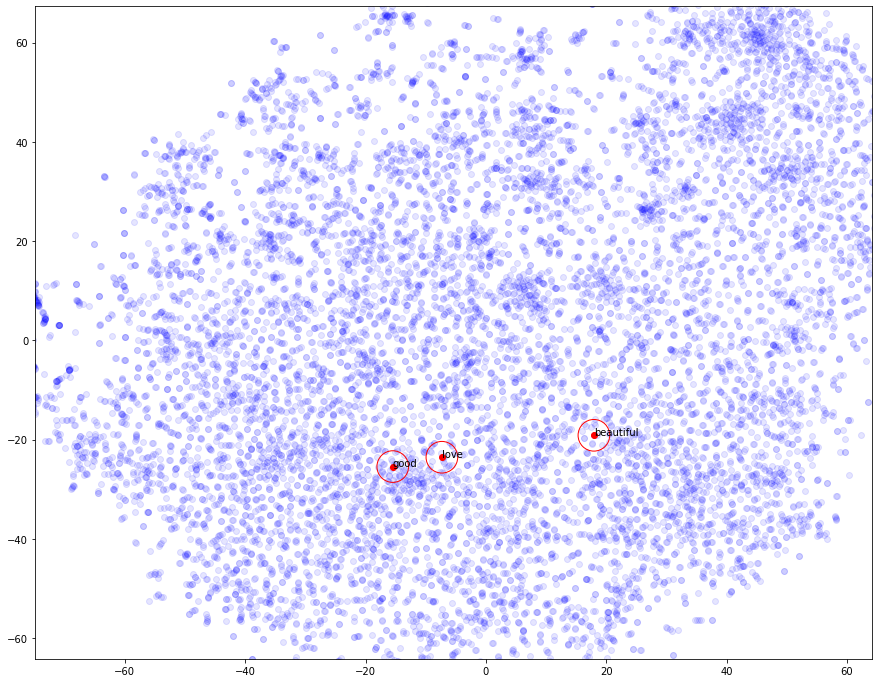

In [ ]:
### YOUR CODE HERE ###
reduced_tSNE_dense = reduce_tSNE(embedding_matrix)
visualize_embeddings(reduced_tSNE_dense, ['good', 'love', 'beautiful'], word_to_idx)
plt.show()

Feel free to play with visualization!

Glove 100

[==================================================] 100.0% 128.1/128.1MB downloaded


  0%|          | 0/11380 [00:00<?, ?it/s]

Done

Building embedding matrix for glove 100


100%|██████████| 11380/11380 [01:57<00:00, 96.69it/s]


Done
Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']


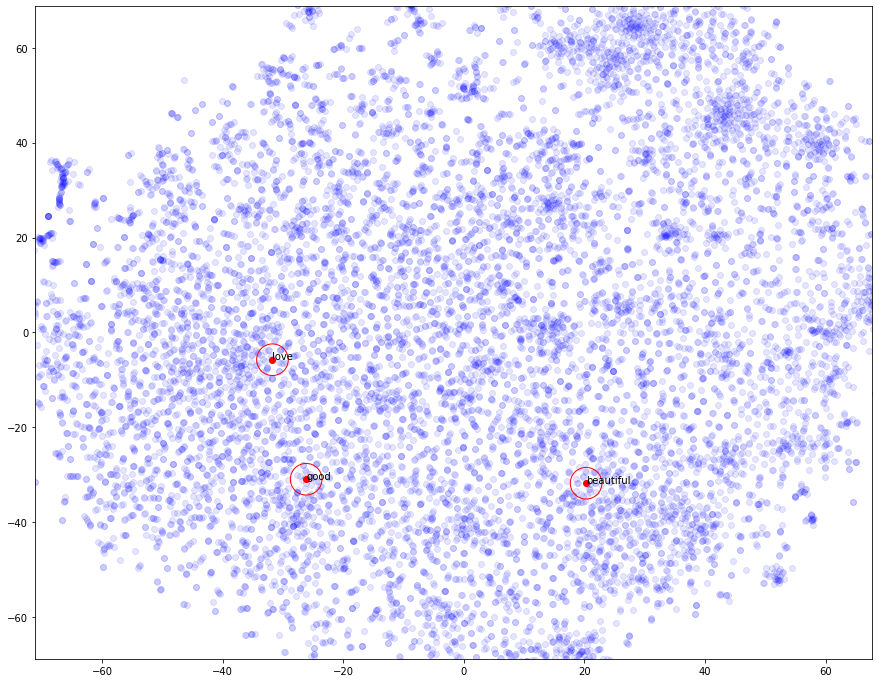

In [ ]:
### YOUR CODE HERE ###
if 'embedding_model_glove_100' not in globals():
    print('Downloading glove-100')
    embedding_model_glove_100 = load_embedding_model('glove', 100)
    print('Done')

if 'dmat_glove_100' not in globals():
    print('\nBuilding embedding matrix for glove 100')
    dmat_glove_100 = build_embedding_matrix(embedding_model_glove_100, 100, word_to_idx, idx_to_word, oov_terms, co_occurrence_count_matrix)
    print('Done')


if 'reduced_tSNE_glove_100' not in globals():
    reduced_tSNE_glove_100 = reduce_tSNE(dmat_glove_100)

visualize_embeddings(reduced_tSNE_glove_100, ['good', 'love', 'beautiful'], word_to_idx)
plt.show()

Glove 300


[===============================================---] 95.2% 358.2/376.1MB downloaded


  0%|          | 0/11380 [00:00<?, ?it/s]

Done

Building embedding matrix for glove 300


100%|██████████| 11380/11380 [01:56<00:00, 97.58it/s]


Done
Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']


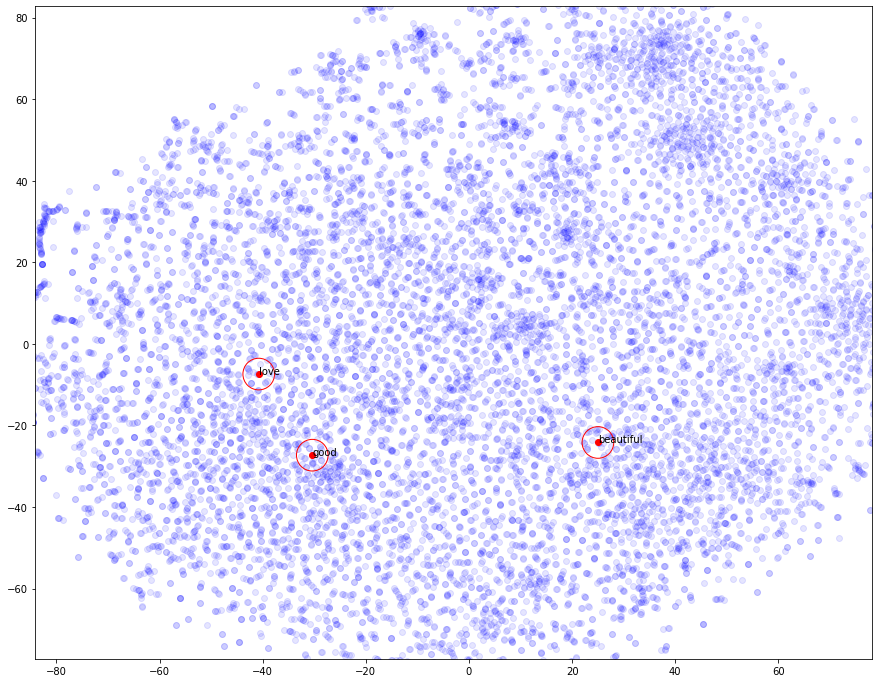

In [ ]:
### YOUR CODE HERE ###
if 'embedding_model_glove_300' not in globals():
    print('\nDownloading glove-300')
    embedding_model_glove_300 = load_embedding_model('glove', 300)
    print('Done')

if 'dmat_glove_300' not in globals():
    print('\nBuilding embedding matrix for glove 300')
    dmat_glove_300 = build_embedding_matrix(embedding_model_glove_300, 300, word_to_idx, idx_to_word, oov_terms, co_occurrence_count_matrix)
    print('Done')


if 'reduced_tSNE_glove_300' not in globals():
    reduced_tSNE_glove_300 = reduce_tSNE(dmat_glove_300)

visualize_embeddings(reduced_tSNE_glove_300, ['good', 'love', 'beautiful'], word_to_idx)
plt.show()

Word2Vec 300


[==================================================] 100.0% 1662.8/1662.8MB downloaded


  0%|          | 0/11380 [00:00<?, ?it/s]

Done

Building embedding matrix for word2vec


100%|██████████| 11380/11380 [06:55<00:00, 27.39it/s]


Done
Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!
Annotating words: ['good', 'love', 'beautiful']


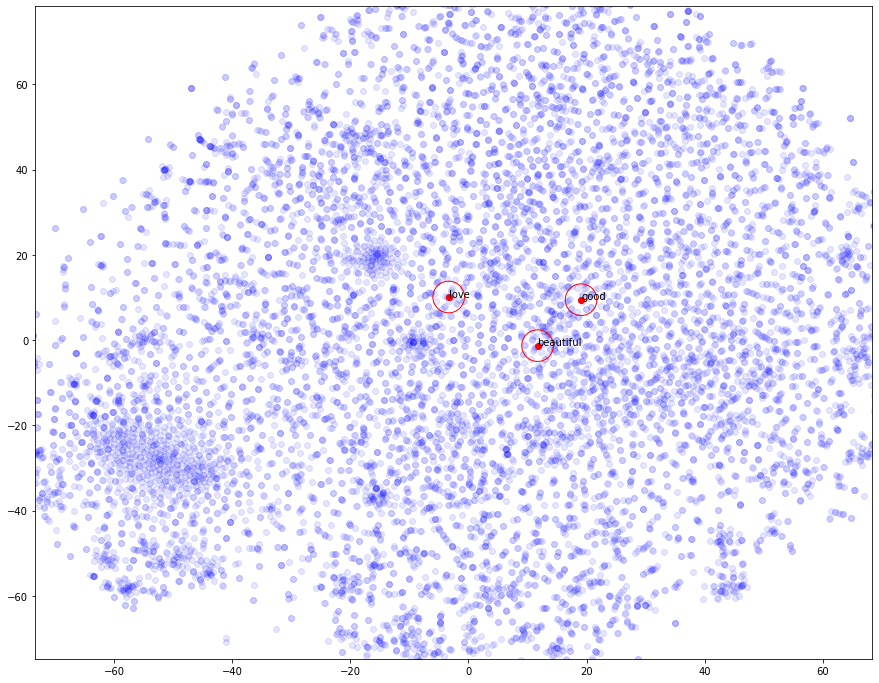

In [ ]:
### YOUR CODE HERE ###
if 'embedding_model_w2v' not in globals():
    print('\nDownloading w-300')
    embedding_model_w2v = load_embedding_model('word2vec', 300)
    print('Done')

if 'oov_terms_w2v' not in globals():
    oov_terms_w2v = check_OOV_terms(embedding_model_w2v, word_listing)

if 'dmat_word2vec' not in globals():
    print('\nBuilding embedding matrix for word2vec')
    dmat_word2vec = build_embedding_matrix(embedding_model_w2v, 300, word_to_idx, idx_to_word, oov_terms_w2v, co_occurrence_count_matrix)
    print('Done')


if 'reduced_tSNE_word2vec' not in globals():
    reduced_tSNE_word2vec = reduce_tSNE(dmat_word2vec)

visualize_embeddings(reduced_tSNE_word2vec, ['good', 'love', 'beautiful'], word_to_idx)
plt.show()

## [Let's play!] Embedding properties (cont'd)

Choose a word embedding property to analyse (synonyms, analogies, bias) and either select and describe a new example or pick an old one and compare previously achieved results with current ones!

#### **Synonims / Antonyms**

In [ ]:
### YOUR CODE HERE  ###
similarity_matrix_dense = cosine_similarity(embedding_matrix, embedding_matrix, transpose_q=True)
reduced_tSNE_dense_syn_ant = reduce_tSNE(similarity_matrix_dense)

Running t-SNE reduction method... (it may take a while...)
t-SNE reduction completed!


Start plotting embeddings


Annotating words: ['movie', 'film']



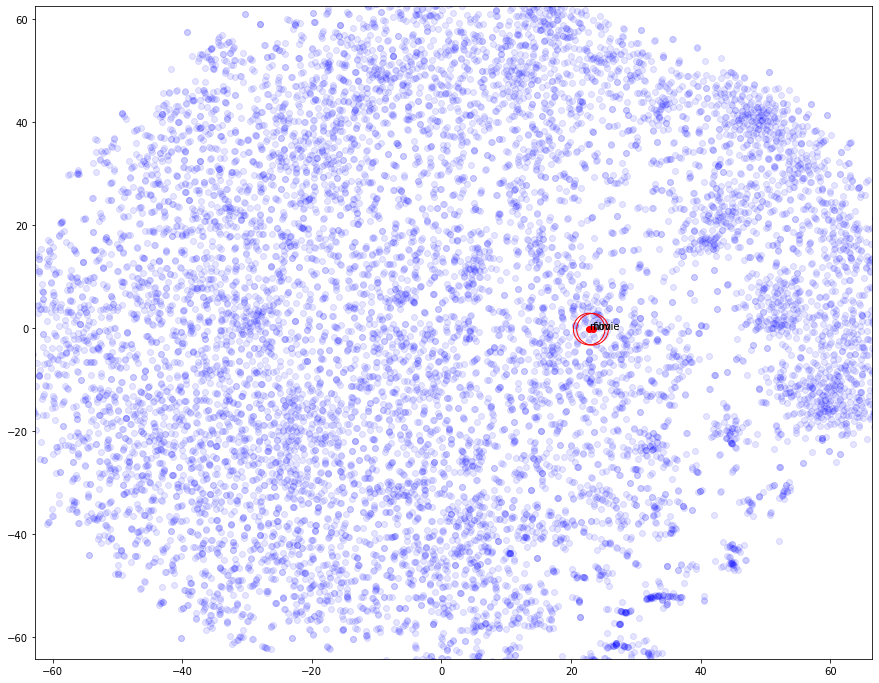


Annotating words: ['woman', 'girl']



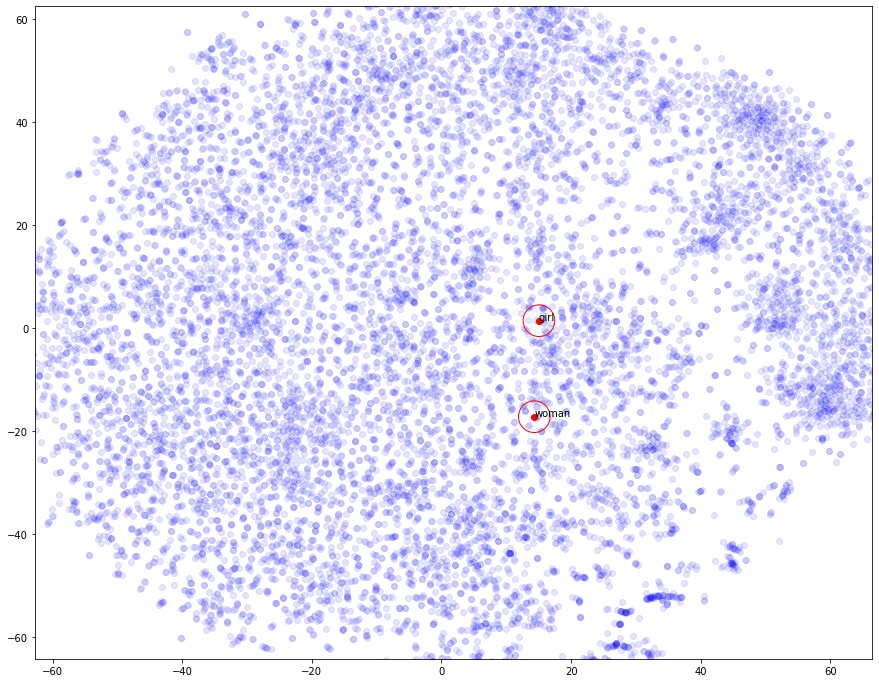


Annotating words: ['boring', 'dull', 'uninteresting', 'bright', 'exciting', 'interesting']



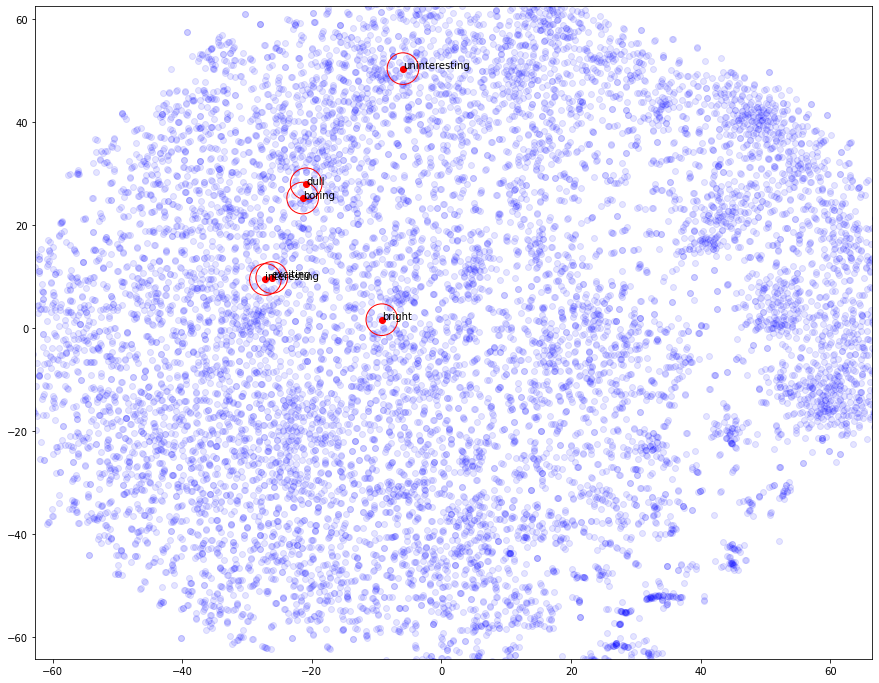


Annotating words: ['wonderful', 'good', 'bad', 'horrid']



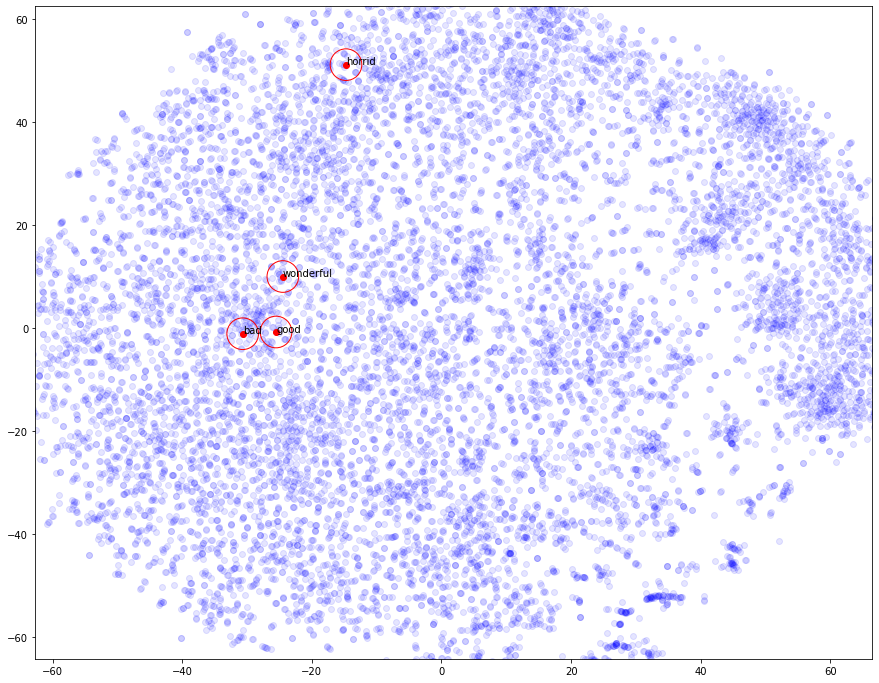

In [ ]:
### YOUR CODE HERE  ###
show_embeddings(reduced_tSNE_dense_syn_ant, syn_ant_list, word_to_idx, embedding_matrix, similarity_matrix_dense, verbose=False)

Let's try to look at the nighbourhood of some words

In [ ]:
### YOUR CODE HERE  ###
print_closest_words(syn_ant_words, reduced_tSNE_dense_syn_ant, word_to_idx, idx_to_word, embedding_matrix, similarity_matrix_dense, 10, plot=False)

Closest words to beautiful: ['lovely', 'gorgeous', 'handsome', 'glorious', 'magnificent', 'splendid', 'charming', 'scenery', 'eccentric']

Closest words to bad: ['wouldt', 'worse', 'unwatchably', 'unfortunately', 'realized', 'happen', 'happened', 'happening', 'nothing']

Closest words to actor: ['simonella', 'actress', 'newcomer', 'presenter', 'dancer', 'comedian', 'filmmaker', 'emmy', 'starred']



#### **Analogies**

In [ ]:
### YOUR CODE HERE  ###
print_topk_analogies(embedding_matrix, idx_to_word, word_to_idx, pos_neg_listings, K)

tragic : good :: scene : x
Top K words:  ['well', 'werent', 'looking', 'instead', 'puling', 'extentions', 'put', 'got', 'get', 'duchovney']
Top K values:  [0.80676544 0.80140617 0.79843169 0.78037939 0.77386044 0.7711124
 0.76986848 0.76871713 0.76806028 0.76602345] 

tv : episode :: film : x
Top K words:  ['novel', 'adaptation', 'sequel', 'fked', 'screenplay', 'diologue', 'itthe', 'whaaa', 'drama', 'movie']
Top K values:  [0.80193006 0.78371277 0.76385335 0.75338054 0.74150394 0.73107603
 0.73012368 0.70926574 0.7015299  0.69955817] 

superb : masterpiece :: tragic : x
Top K words:  ['tragedy', 'myth', 'haunted', 'betrayal', 'horrible', 'unspeakable', 'mystery', 'sad', 'horror', 'tale']
Top K values:  [0.77367763 0.69516573 0.67637688 0.6467255  0.64291376 0.64187712
 0.64052596 0.63898757 0.63370259 0.63302694] 

man : king :: woman : x
Top K words:  ['queen', 'daughter', 'prince', 'throne', 'princess', 'elizabeth', 'trannies', 'goffen', 'sidede', 'father']
Top K values:  [0.86095812

#### **Biases**

In [ ]:
### YOUR CODE HERE  ###
print('Biases for {} and {}\n\n'.format(bias_pos, bias_neg))
print_bias_list(embedding_matrix, word_to_idx, bias_pos, bias_neg, word_list_biases)

Biases for woman and man


doctor:        0.11895286811263203
secretary:     -0.14939684071680198
person:        0.09119727542116811
actor:         -0.08387557555319584
beauty:        0.2046186413988713
student:       0.14774991847673424
friend:        -0.006016776056933476
king:          -0.1887568785981062
queen:         0.2044892979559169
majesty:       -0.006226725952190704
girl:          0.3484373782134623
actress:       0.3342249363798376
makeup:        0.29605082073802513


#### Considerations about Dense embedding proprierties
The overall outcome had great improvements with respect to the previous embeddings used. This should be attributable to the usage of a pre-trained model: one of the reasons behind the poor results obtained previously lies in the lack of semantic data that can be exploited to perform semantic analysis, here such semantic data is already provided by the pre-trained model.<br>

**Synonims / Antonyms**<br>
> While the plotting of different synonims and antomyms does not evidentiate major improvement with respect to the previous study cases, the analysis of the neighbouring words of a given words show more interesting results indeed. In particular after analizing some words it can be seen how much more consistent it is the neighbourhood of the analyzed words with respect to the sparse cases. for example "beautiful" has as closest nighbours: "lovely", "gorgeous", "handsome", "splendid", "magnificent"; while in the sparse case in was: "monkey", "considered", "gotten", "mad", "plant".<br>

**Analogies**<br>
> It can be observed great improvements with respect to both co-occurence matix and PPMI matrix cases: almost all the queries can be said to have positive outcomes.<br>

**Bias**<br>
> I can be observed that now all the gender-related words hold a correct bias and the same it can be said to hold for those words that can be said to belong to the are of influence of a specific gender (like how "makeup" and "beauty" are biased toward "woman").



# Contact

For any doubt, question, issue or help, you can always contact us at the following email addresses:

Teaching Assistants:

* Andrea Galassi -> a.galassi@unibo.it
* Federico Ruggeri -> federico.ruggeri6@unibo.it

Professor:

* Paolo Torroni -> p.torroni@unibo.it

Don't forget that your feedback is very important! Your suggestions help us improving course material.

# FAQ

---

**Q: Is it ok if I work with a small slice of the dataset?**

**A:** Yes, it is perfectly ok! The aim of this assignment is to look at word embedding methods and assess semantic properties. Large datasets usually imply large vocabularies and efficient sparse encoding methods have to be considered. Since such methods (see scipy documentation) might be complex to handle (especially under a colab session), you are free to work with small corpora.

---

**Q: Do I have to use both dimensionality reduction methods?**

**A:** Just one is fine! We suggest to try both of them at least once!

---

**Q: I'm struggling find good examples for analogies, bias and other scenarios!**

**A:** It is perfectly fine, this is just a simple example where we want you to look at
different encoding methods. Try to find at least one example that sounds good to you and motivate obtained results. Most probably, you won't find a perfect corrispondence of your expectations, but for us what's important is that you develop a critic approach, baring in mind that data has to explored before anything else.

---

**Q: Isn't stopwords removal excessive?**

**A:** Indeed, removing all stopwords might alter sentence meaning! However, they also alter co-occurrence matrices due to their high frequency. Not ignoring them leads to poor results when considering semantic properties. It's up to you whether removing or keeping stopwords! (remember to comment the corresponding method under [Some Cleaning](https://colab.research.google.com/drive/1UkGz0vdhPXh9NeApG7mYtY6e-jRcR3if#scrollTo=2TLTu0-2JQwi&line=3&uniqifier=1) section.

---

**Q: Can we modify functions signature?**

**A:** Functions that you have to complete can be modified as you please! Current functions definition should consider all required inputs in most cases.

---

**Q: Can we modify the dataset slicing step**

**A:** Yes, of course! The current slicing is just one possibility.

---
